In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 104.3 MB/s eta 0:00:00


In [3]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import cv2
import json
from PIL import Image
import os
import torch
import torch.nn as nn
import torch.nn.functional as F

In [4]:
dataset_path_rgn = "drive/MyDrive/Image-results-tiff-of-ragunan"
number_to_load_rgn = ['417708', '417709', '417710', '417711', '417712', '417713', '417714', '417715', '417716', '417717', '417718', '417719']

images_paths = []
masks_paths = []

images_dir = os.path.join(dataset_path_rgn, 'image')
masks_dir = os.path.join(dataset_path_rgn, 'mask')

for numb_name in number_to_load_rgn:
    images_dir = os.path.join(dataset_path_rgn, 'image', numb_name)
    masks_dir = os.path.join(dataset_path_rgn, 'mask', numb_name)
    if os.path.isdir(images_dir) and os.path.isdir(masks_dir):
        image_path = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith('.tif')])
        mask_path = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith('.tif')])

        images_paths.extend(image_path)
        masks_paths.extend(mask_path)

In [5]:
from sklearn.model_selection import train_test_split

image_train, image_test, mask_train, mask_test = train_test_split(
    images_paths, masks_paths, test_size = 0.2, random_state = 84
)

image_test, image_val, mask_test, mask_val = train_test_split(
    image_test, mask_test, test_size = 0.5, random_state = 84
)

In [6]:
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torchvision.transforms import ToTensor

train_transform = A.Compose([
    A.HorizontalFlip(p = 0.5),
    A.VerticalFlip(p = 0.5),
    A.RandomRotate90(p = 0.5),
    A.RandomBrightnessContrast(p = 0.5),
    A.MedianBlur(blur_limit = 5, p = 0.5),
    A.GaussNoise(std_range = (0.01, 0.05), p = 0.5),
    ToTensorV2()
])

test_transform = A.Compose([
    ToTensorV2()
])

val_transform = A.Compose([
    ToTensorV2()
])

def remove_outliers_img(image_array, lower_value = 1, upper_value = 99):
    stretched = np.zeros_like(image_array, dtype = np.float32)

    for i in range(image_array.shape[2]):
        band = image_array[:, :, i].astype(np.float32)
        lower_limit = np.percentile(band, lower_value)
        upper_limit = np.percentile(band, upper_value)

        if upper_limit - lower_limit < 1e-6:
            stretched[:, :, i] = band
        else:
            stretched[:, :, i] = np.clip((band - lower_limit) / (upper_limit - lower_limit) * 255.0, 0, 255)

    return stretched.astype(np.uint8)

class SegmentDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform = None, apply_remove_outliers = True):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform
        self.apply_remove_outliers = apply_remove_outliers

    def __len__(self):
        return len(self.image_paths)

    def normalize(self, image, mask):
        image = (image - image.min()) / (image.max() - image.min() + 1e-8)
        mask = (mask > 0.5).float()
        return image, mask

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        image = np.array(Image.open(image_path).convert("RGB"), dtype = np.float32)
        mask = np.array(Image.open(mask_path).convert("L"), dtype = np.uint8)

        if self.apply_remove_outliers:
            image = remove_outliers_img(image)

        if self.transform:
            augmented = self.transform(image = image, mask = mask)
            image = augmented["image"]
            mask = augmented["mask"]
        else:
            image = torch.tensor(image).permute(2, 0, 1) / 255.0
            mask = torch.tensor(mask)

        mask = (mask > 0.5).float()
        mask = mask.unsqueeze(0).float()

        image, mask = self.normalize(image, mask)

        return image, mask, image_path, mask_path

In [7]:
train_dataset = SegmentDataset(image_train, mask_train, transform = train_transform)
train_loader = DataLoader(train_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = True)

test_dataset = SegmentDataset(image_test, mask_test, transform = test_transform)
test_loader = DataLoader(test_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = False)

val_dataset = SegmentDataset(image_val, mask_val, transform = val_transform)
val_loader = DataLoader(val_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = False)

In [8]:
train_size = len(train_dataset)
val_size = len(val_dataset)
test_size = len(test_dataset)

print(f"Train size: {train_size}")
print(f"Validation size: {val_size}")
print(f"Test size: {test_size}")

Train size: 144
Validation size: 18
Test size: 18


In [9]:
image_train, mask_train, img_path_train, mask_path_train = train_dataset[0]
print(image_train)
print(image_train.shape)

tensor([[[0.0549, 0.1176, 0.0353,  ..., 0.2980, 0.3451, 0.3451],
         [0.0863, 0.0039, 0.0863,  ..., 0.3529, 0.3529, 0.3608],
         [0.0314, 0.0941, 0.0549,  ..., 0.3686, 0.3961, 0.3137],
         ...,
         [0.1176, 0.1451, 0.1373,  ..., 0.4196, 0.4314, 0.4039],
         [0.1843, 0.1373, 0.1137,  ..., 0.5098, 0.5255, 0.4941],
         [0.0549, 0.0157, 0.1216,  ..., 0.5451, 0.5765, 0.5294]],

        [[0.0745, 0.0627, 0.1059,  ..., 0.1490, 0.2314, 0.2118],
         [0.0588, 0.1059, 0.0863,  ..., 0.2039, 0.1490, 0.2275],
         [0.1255, 0.0863, 0.0902,  ..., 0.1608, 0.2275, 0.3098],
         ...,
         [0.2039, 0.1098, 0.1137,  ..., 0.3216, 0.3725, 0.3686],
         [0.1216, 0.1294, 0.1294,  ..., 0.3843, 0.4275, 0.5020],
         [0.0235, 0.0275, 0.1333,  ..., 0.5216, 0.5020, 0.5333]],

        [[0.0078, 0.0706, 0.0667,  ..., 0.2510, 0.2039, 0.2000],
         [0.0706, 0.0980, 0.0549,  ..., 0.2000, 0.2627, 0.2353],
         [0.0471, 0.0000, 0.0627,  ..., 0.2000, 0.2235, 0.

In [10]:
print(mask_train)
print(mask_train.shape)

tensor([[[1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         ...,
         [1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]])
torch.Size([1, 256, 256])


In [11]:
image_test, mask_test, img_path_test, mask_path_test = test_dataset[0]
print(image_test)
print(image_test.shape)

tensor([[[0.1529, 0.1216, 0.1176,  ..., 0.3804, 0.4588, 0.1725],
         [0.2392, 0.2118, 0.1922,  ..., 0.2941, 0.2745, 0.1333],
         [0.2745, 0.2549, 0.2314,  ..., 0.1059, 0.1412, 0.2353],
         ...,
         [0.7961, 0.8000, 0.8118,  ..., 0.2706, 0.2588, 0.0863],
         [0.7961, 0.8000, 0.8039,  ..., 0.0667, 0.0627, 0.1020],
         [0.7882, 0.7961, 0.8000,  ..., 0.0392, 0.0000, 0.0627]],

        [[0.1137, 0.0824, 0.0784,  ..., 0.3490, 0.4431, 0.1412],
         [0.2078, 0.1765, 0.1569,  ..., 0.2745, 0.2510, 0.1098],
         [0.2510, 0.2275, 0.2039,  ..., 0.0824, 0.1176, 0.2353],
         ...,
         [0.7765, 0.7843, 0.7922,  ..., 0.2667, 0.2549, 0.0706],
         [0.7765, 0.7843, 0.7882,  ..., 0.0510, 0.0392, 0.0824],
         [0.7725, 0.7765, 0.7843,  ..., 0.0196, 0.0000, 0.0392]],

        [[0.1137, 0.0824, 0.0784,  ..., 0.3961, 0.5020, 0.1922],
         [0.2078, 0.1765, 0.1569,  ..., 0.3137, 0.3059, 0.1569],
         [0.2353, 0.2157, 0.1882,  ..., 0.1216, 0.1686, 0.

In [12]:
print(mask_test)
print(mask_test.shape)

tensor([[[1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]])
torch.Size([1, 256, 256])


In [13]:
image_val, mask_val, img_path_val, mask_path_val = val_dataset[0]
print(image_val)
print(image_val.shape)

tensor([[[0.4314, 0.3490, 0.3098,  ..., 0.1608, 0.2431, 0.2510],
         [0.3333, 0.4000, 0.2275,  ..., 0.1490, 0.1686, 0.1333],
         [0.3490, 0.4980, 0.2980,  ..., 0.2157, 0.1922, 0.1490],
         ...,
         [0.2078, 0.2157, 0.2078,  ..., 0.3804, 0.4980, 0.3922],
         [0.1922, 0.2078, 0.2078,  ..., 0.5725, 0.5216, 0.4549],
         [0.1843, 0.2000, 0.2078,  ..., 0.3843, 0.5294, 0.5490]],

        [[0.4235, 0.3294, 0.2784,  ..., 0.1843, 0.2784, 0.2863],
         [0.3098, 0.3882, 0.1843,  ..., 0.1686, 0.1922, 0.1490],
         [0.3294, 0.4980, 0.2706,  ..., 0.2431, 0.2196, 0.1686],
         ...,
         [0.2275, 0.2353, 0.2275,  ..., 0.4118, 0.5059, 0.3882],
         [0.2118, 0.2275, 0.2275,  ..., 0.6353, 0.5333, 0.4549],
         [0.2000, 0.2196, 0.2275,  ..., 0.4235, 0.5412, 0.5647]],

        [[0.4078, 0.3098, 0.2431,  ..., 0.1882, 0.2863, 0.2941],
         [0.2941, 0.3725, 0.1451,  ..., 0.1725, 0.2000, 0.1529],
         [0.3098, 0.4863, 0.2510,  ..., 0.2510, 0.2235, 0.

In [14]:
print(mask_val)
print(mask_val.shape)

tensor([[[0., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 0., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]]])
torch.Size([1, 256, 256])


In [15]:
for i, (image, mask, img_path, mask_path) in enumerate(train_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

Empty mask found at index 38


In [16]:
for i, (image, mask, img_path, mask_path) in enumerate(test_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [17]:
for i, (image, mask, img_path, mask_path) in enumerate(val_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [18]:
for img_path, mask_path in zip(images_paths[:5], masks_paths[:5]):
    print(f"Image: {os.path.basename(img_path)} - Mask: {os.path.basename(mask_path)}")

Image: 271333.tif - Mask: 271333_mask.tif
Image: 271334.tif - Mask: 271334_mask.tif
Image: 271335.tif - Mask: 271335_mask.tif
Image: 271336.tif - Mask: 271336_mask.tif
Image: 271337.tif - Mask: 271337_mask.tif


In [19]:
for image, mask, img_path, mask_path in train_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [20]:
for image, mask, img_path, mask_path in test_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [21]:
for image, mask, img_path, mask_path in val_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [22]:
class DiceFocalLoss(nn.Module):
    def __init__(self, dice_weight, focal_weight, alpha = 0.25, gamma = 2.0):
        super(DiceFocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.dice_weight = dice_weight
        self.focal_weight = focal_weight

    def forward(self, inputs, targets, smooth = 1e-6):
        bce_loss = F.binary_cross_entropy_with_logits(inputs, targets, reduction = "none")
        pt = torch.exp(-bce_loss)
        focal_loss = (self.alpha * (1 - pt) ** self.gamma * bce_loss).mean()

        probs = torch.sigmoid(inputs)
        probs = probs.contiguous().view(probs.shape[0], -1)
        targets = targets.contiguous().view(targets.shape[0], -1)

        intersection = (probs * targets).sum(dim = 1)
        dice_score = (2.0 * intersection + smooth) / (probs.sum(dim = 1) + targets.sum(dim = 1) + smooth)
        dice_loss = 1 - dice_score.mean()

        loss = self.dice_weight * dice_loss + self.focal_weight * focal_loss
        return loss

In [23]:
def calc_iou(pred_mask, gt_mask, smooth = 1e-6):
    pred_mask = torch.sigmoid(pred_mask.detach())
    pred_mask = (pred_mask > 0.5).float()

    gt_mask = (gt_mask.detach() > 0).float()

    if pred_mask.dim() == 3:
        pred_mask = pred_mask.unsqueeze(1)
    if gt_mask.dim() == 3:
        gt_mask = gt_mask.unsqueeze(1)

    batch_size = pred_mask.shape[0]
    iou_list = []

    for i in range(batch_size):
        gt = gt_mask[i]
        pred = pred_mask[i]

        intersect = (pred * gt).sum()
        union = pred.sum() + gt.sum() - intersect

        if gt.sum() == 0:
            if pred.sum() == 0:
                iou = 1.0
            else:
                iou = 0.0
        else:
            iou = (intersect + smooth) / (union + smooth)

        iou_list.append(iou)

    return torch.tensor(iou_list).mean().item()

In [24]:
!pip install transformers datasets accelerate timm

In [25]:
from transformers import SegformerFeatureExtractor, SegformerForSemanticSegmentation

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = SegformerForSemanticSegmentation.from_pretrained(
    "nvidia/segformer-b5-finetuned-ade-640-640",
    num_labels = 2,
    ignore_mismatched_sizes = True
).to(device)

for param in model.segformer.encoder.parameters():
    param.requires_grad = False

for param in model.segformer.encoder.block[3].parameters():
    param.requires_grad = True

for m in model.modules():
    if isinstance(m, nn.BatchNorm2d):
        for param in m.parameters():
            param.requires_grad = True

trainable_params = [p for p in model.parameters() if p.requires_grad]
print(f"Trainable parameters: {sum(p.numel() for p in trainable_params)}")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/339M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/339M [00:00<?, ?B/s]

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Trainable parameters: 12670466


In [26]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.7/404.7 kB 9.5 MB/s eta 0:00:00


In [27]:
import torch.optim as optim
from tqdm import tqdm
import warnings
from torch.optim.lr_scheduler import StepLR, ReduceLROnPlateau, CosineAnnealingLR
import optuna

warnings.filterwarnings("ignore")

def train_model(model, train_loader, val_loader, device, scheduler_type, dice_weight, focal_weight):
    loss_func = DiceFocalLoss(dice_weight = dice_weight, focal_weight = focal_weight)

    optimizer = optim.AdamW([
        {"params": model.segformer.encoder.block[-1].parameters(), "lr": 0.0001},
        {"params": model.decode_head.parameters(), "lr": 0.0001}
    ])

    num_epoch = 25

    if scheduler_type == "steplr":
        scheduler = StepLR(optimizer, step_size = 5, gamma = 0.5)
    elif scheduler_type == "reducelr":
        scheduler = ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.5, patience = 5)
    else:
        scheduler = CosineAnnealingLR(optimizer, T_max = num_epoch)

    patience = 10
    trigger = 0
    best_val_loss = float('inf')
    best_model = None

    for epoch in range(num_epoch):

        model.train()
        total_loss = 0
        total_iou = 0

        for images, masks, _, _ in tqdm(train_loader):
            images, masks = images.to(device), masks.to(device)

            optimizer.zero_grad()
            outputs = model(pixel_values = images)
            logits = outputs.logits

            logits = torch.nn.functional.interpolate(
                logits, size = masks.shape[2:], mode = "bilinear", align_corners = False
            )

            logits = logits[:, 1:2, :, :]
            loss = loss_func(logits, masks.float())
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_iou += calc_iou(logits, masks)

        avg_loss = total_loss / len(train_loader)
        avg_iou = total_iou / len(train_loader)

        print(f"Epoch {epoch + 1}/{num_epoch}")
        print(f"Train Loss: {avg_loss}, Train Avg IoU: {avg_iou}")

        model.eval()
        val_loss = 0
        val_iou = 0

        with torch.no_grad():
            for val_images, val_masks, _, _ in tqdm(val_loader):
                val_images, val_masks = val_images.to(device), val_masks.to(device)
                outputs = model(pixel_values=val_images)
                logits = outputs.logits
                logits = torch.nn.functional.interpolate(
                    logits, size = val_masks.shape[2:], mode = "bilinear", align_corners = False
                )
                logits = logits[:, 1:2, :, :]
                loss = loss_func(logits, val_masks.float())
                val_loss += loss.item()
                val_iou += calc_iou(logits, val_masks)

        val_avg_loss = val_loss / len(val_loader)
        val_avg_iou = val_iou / len(val_loader)

        if isinstance(scheduler, ReduceLROnPlateau):
            scheduler.step(val_avg_loss)
        else:
            scheduler.step()

        print(f"Val Loss: {val_avg_loss}, Val Avg IoU: {val_avg_iou}\n")

        if val_avg_loss < best_val_loss:
            best_val_loss = val_avg_loss
            best_model = model
            trigger = 0
        else:
            trigger += 1
        if trigger >= patience:
            print(f"Early stopping at epoch {epoch+1}")
            break

    return best_model, best_val_loss

In [28]:
import gc

fine_tune_model = None

def objective(trial):
    global fine_tune_model
    torch.cuda.empty_cache()
    gc.collect()

    scheduler = trial.suggest_categorical("scheduler", ["steplr", "reducelr", "cosine"])
    dice_weight, focal_weight = trial.suggest_categorical("loss_weight", [(0.3, 0.7), (0.2, 0.8), (0.1, 0.9), (0.0, 1.0)])

    model = SegformerForSemanticSegmentation.from_pretrained(
        "nvidia/segformer-b5-finetuned-ade-640-640",
        num_labels = 2,
        ignore_mismatched_sizes = True
    )

    for param in model.segformer.encoder.parameters():
        param.requires_grad = False

    for param in model.segformer.encoder.block[3].parameters():
        param.requires_grad = True

    for m in model.modules():
        if isinstance(m, nn.BatchNorm2d):
            for param in m.parameters():
                param.requires_grad = True

    def batchnorm_to_groupnorm(model, num_groups = 32):
        for name, module in list(model.named_children()):
            if isinstance(module, nn.BatchNorm2d):
                num_features = module.num_features
                valid_num_groups = min(num_groups, num_features)
                while num_features % valid_num_groups != 0 and valid_num_groups > 1:
                    valid_num_groups -= 1
                new_module = nn.GroupNorm(num_groups = valid_num_groups, num_channels = num_features)
                setattr(model, name, new_module)
            else:
                batchnorm_to_groupnorm(module, num_groups)
        return model

    model = batchnorm_to_groupnorm(model)
    model = model.to(device)

    print(f"====================================================")
    print(f"Trial {trial.number}: scheduler = {scheduler}, dice weight = {dice_weight}, focal weight = {focal_weight}\n")

    best_model, val_loss = train_model(
        model = model,
        train_loader = train_loader,
        val_loader = val_loader,
        device = device,
        scheduler_type = scheduler,
        dice_weight = dice_weight,
        focal_weight = focal_weight
    )

    if not hasattr(objective, "best_loss") or val_loss < objective.best_loss:
        objective.best_loss = val_loss
        fine_tune_model = best_model

    return val_loss

In [29]:
from optuna.samplers import GridSampler

search_space = {
    "scheduler": ["steplr", "reducelr", "cosine"],
    "loss_weight": [(0.3, 0.7), (0.1, 0.9), (0.0, 1.0)]
}

sampler = GridSampler(search_space)
study = optuna.create_study(direction = "minimize", sampler = sampler)
study.optimize(objective, n_trials = 9)

[I 2025-11-15 16:24:42,013] A new study created in memory with name: no-name-a7ace9c7-bf36-4dd4-8d56-61b6f0c8595a
Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Trial 0: scheduler = reducelr, dice weight = 0.0, focal weight = 1.0



100%|██████████| 144/144 [00:36<00:00,  3.97it/s]


Epoch 1/25
Train Loss: 0.030257480781680595, Train Avg IoU: 0.5424789239201562


100%|██████████| 18/18 [00:02<00:00,  7.19it/s]


Val Loss: 0.023788308155619435, Val Avg IoU: 0.629934050142765



100%|██████████| 144/144 [00:22<00:00,  6.39it/s]


Epoch 2/25
Train Loss: 0.021875439279635128, Train Avg IoU: 0.6955023722277262


100%|██████████| 18/18 [00:01<00:00, 12.09it/s]


Val Loss: 0.020984105998650193, Val Avg IoU: 0.6745743358300792



100%|██████████| 144/144 [00:15<00:00,  9.01it/s]


Epoch 3/25
Train Loss: 0.019356327516207885, Train Avg IoU: 0.7174969882725754


100%|██████████| 18/18 [00:01<00:00, 12.21it/s]


Val Loss: 0.019145094660214253, Val Avg IoU: 0.7170796261893378



100%|██████████| 144/144 [00:15<00:00,  9.04it/s]


Epoch 4/25
Train Loss: 0.018152659498607844, Train Avg IoU: 0.7405735875298787


100%|██████████| 18/18 [00:01<00:00,  9.07it/s]


Val Loss: 0.018022193469934993, Val Avg IoU: 0.7281165263719029



100%|██████████| 144/144 [00:16<00:00,  8.84it/s]


Epoch 5/25
Train Loss: 0.01765948003109467, Train Avg IoU: 0.7593574850923486


100%|██████████| 18/18 [00:01<00:00, 12.45it/s]


Val Loss: 0.018360483253167734, Val Avg IoU: 0.7521369117829535



100%|██████████| 144/144 [00:15<00:00,  9.10it/s]


Epoch 6/25
Train Loss: 0.01714269339976858, Train Avg IoU: 0.765140979759714


100%|██████████| 18/18 [00:01<00:00, 12.41it/s]


Val Loss: 0.016973879809180897, Val Avg IoU: 0.765066459774971



100%|██████████| 144/144 [00:15<00:00,  9.07it/s]


Epoch 7/25
Train Loss: 0.016589262935869757, Train Avg IoU: 0.7686694624264621


100%|██████████| 18/18 [00:01<00:00,  9.13it/s]


Val Loss: 0.017450668279909425, Val Avg IoU: 0.7517155342631869



100%|██████████| 144/144 [00:18<00:00,  7.63it/s]


Epoch 8/25
Train Loss: 0.016691733892205067, Train Avg IoU: 0.770657183861153


100%|██████████| 18/18 [00:01<00:00, 12.38it/s]


Val Loss: 0.017160002478501864, Val Avg IoU: 0.7656991481781006



100%|██████████| 144/144 [00:15<00:00,  9.07it/s]


Epoch 9/25
Train Loss: 0.016589703770781245, Train Avg IoU: 0.7742810112734636


100%|██████████| 18/18 [00:01<00:00, 12.50it/s]


Val Loss: 0.017462741505975526, Val Avg IoU: 0.7431235098176532



100%|██████████| 144/144 [00:22<00:00,  6.49it/s]


Epoch 10/25
Train Loss: 0.016001379059869376, Train Avg IoU: 0.7826818389197191


100%|██████████| 18/18 [00:01<00:00, 12.21it/s]


Val Loss: 0.01646366490361591, Val Avg IoU: 0.7662666274441613



100%|██████████| 144/144 [00:15<00:00,  9.09it/s]


Epoch 11/25
Train Loss: 0.01549866604717762, Train Avg IoU: 0.7911870002539622


100%|██████████| 18/18 [00:01<00:00, 11.06it/s]


Val Loss: 0.01666603369327883, Val Avg IoU: 0.7692527605427636



100%|██████████| 144/144 [00:16<00:00,  8.81it/s]


Epoch 12/25
Train Loss: 0.015901754614888988, Train Avg IoU: 0.7939771047482888


100%|██████████| 18/18 [00:01<00:00, 12.36it/s]


Val Loss: 0.01683568486219479, Val Avg IoU: 0.7550186895661883



100%|██████████| 144/144 [00:16<00:00,  8.96it/s]


Epoch 13/25
Train Loss: 0.015326695798042541, Train Avg IoU: 0.7843578960746527


100%|██████████| 18/18 [00:01<00:00, 12.24it/s]


Val Loss: 0.01694377959291968, Val Avg IoU: 0.7692873146798875



100%|██████████| 144/144 [00:16<00:00,  8.99it/s]


Epoch 14/25
Train Loss: 0.015501878395197208, Train Avg IoU: 0.7936238319509559


100%|██████████| 18/18 [00:01<00:00, 11.62it/s]


Val Loss: 0.016599843019826546, Val Avg IoU: 0.7659110791153378



100%|██████████| 144/144 [00:16<00:00,  8.63it/s]


Epoch 15/25
Train Loss: 0.014989335803774238, Train Avg IoU: 0.7934552648415168


100%|██████████| 18/18 [00:01<00:00, 12.17it/s]


Val Loss: 0.0173019348229799, Val Avg IoU: 0.7522081567181481



100%|██████████| 144/144 [00:15<00:00,  9.06it/s]


Epoch 16/25
Train Loss: 0.01503231778163657, Train Avg IoU: 0.791579599906173


100%|██████████| 18/18 [00:01<00:00, 11.83it/s]


Val Loss: 0.017273487161017127, Val Avg IoU: 0.7548267386025853



100%|██████████| 144/144 [00:15<00:00,  9.03it/s]


Epoch 17/25
Train Loss: 0.01495134051704857, Train Avg IoU: 0.7970334864738915


100%|██████████| 18/18 [00:01<00:00, 11.26it/s]


Val Loss: 0.016957454254022904, Val Avg IoU: 0.7570805880758498



100%|██████████| 144/144 [00:16<00:00,  8.58it/s]


Epoch 18/25
Train Loss: 0.01524710604442387, Train Avg IoU: 0.7978411667669812


100%|██████████| 18/18 [00:01<00:00, 12.33it/s]


Val Loss: 0.017322757565933797, Val Avg IoU: 0.7514835596084595



100%|██████████| 144/144 [00:15<00:00,  9.12it/s]


Epoch 19/25
Train Loss: 0.014277253680322448, Train Avg IoU: 0.8068382121208642


100%|██████████| 18/18 [00:01<00:00, 12.44it/s]


Val Loss: 0.017839243739015527, Val Avg IoU: 0.7491686989863714



100%|██████████| 144/144 [00:16<00:00,  8.94it/s]


Epoch 20/25
Train Loss: 0.014318965249913163, Train Avg IoU: 0.8012833665642474


100%|██████████| 18/18 [00:01<00:00, 12.07it/s]
[I 2025-11-15 16:31:13,329] Trial 0 finished with value: 0.01646366490361591 and parameters: {'scheduler': 'reducelr', 'loss_weight': (0.0, 1.0)}. Best is trial 0 with value: 0.01646366490361591.


Val Loss: 0.01690934166415698, Val Avg IoU: 0.7615180015563965

Early stopping at epoch 20


Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Trial 1: scheduler = cosine, dice weight = 0.3, focal weight = 0.7



100%|██████████| 144/144 [00:16<00:00,  8.95it/s]


Epoch 1/25
Train Loss: 0.13963648829505676, Train Avg IoU: 0.623014510863868


100%|██████████| 18/18 [00:01<00:00, 11.71it/s]


Val Loss: 0.1139933622131745, Val Avg IoU: 0.6833050698041916



100%|██████████| 144/144 [00:15<00:00,  9.12it/s]


Epoch 2/25
Train Loss: 0.10639841206527005, Train Avg IoU: 0.7193731290009671


100%|██████████| 18/18 [00:01<00:00, 12.61it/s]


Val Loss: 0.0995338223874569, Val Avg IoU: 0.7310466584232118



100%|██████████| 144/144 [00:15<00:00,  9.09it/s]


Epoch 3/25
Train Loss: 0.09676241988523139, Train Avg IoU: 0.7383216608238096


100%|██████████| 18/18 [00:01<00:00,  9.35it/s]


Val Loss: 0.09173201697154178, Val Avg IoU: 0.7462954173485438



100%|██████████| 144/144 [00:15<00:00,  9.13it/s]


Epoch 4/25
Train Loss: 0.08849746825742638, Train Avg IoU: 0.7567378852205972


100%|██████████| 18/18 [00:01<00:00, 12.85it/s]


Val Loss: 0.08801893817467822, Val Avg IoU: 0.7465690837966071



100%|██████████| 144/144 [00:15<00:00,  9.31it/s]


Epoch 5/25
Train Loss: 0.08425340206465787, Train Avg IoU: 0.7627617994892515


100%|██████████| 18/18 [00:01<00:00, 12.84it/s]


Val Loss: 0.08300335208574931, Val Avg IoU: 0.7635526027944353



100%|██████████| 144/144 [00:15<00:00,  9.24it/s]


Epoch 6/25
Train Loss: 0.08233544734927516, Train Avg IoU: 0.7678389347468814


100%|██████████| 18/18 [00:01<00:00, 10.24it/s]


Val Loss: 0.07884662577675448, Val Avg IoU: 0.7718003143866857



100%|██████████| 144/144 [00:16<00:00,  8.92it/s]


Epoch 7/25
Train Loss: 0.07663259383601446, Train Avg IoU: 0.7906624066332976


100%|██████████| 18/18 [00:01<00:00, 12.70it/s]


Val Loss: 0.07921841461211443, Val Avg IoU: 0.7585600713888804



100%|██████████| 144/144 [00:15<00:00,  9.37it/s]


Epoch 8/25
Train Loss: 0.07829770545423445, Train Avg IoU: 0.7744191326200962


100%|██████████| 18/18 [00:01<00:00, 12.11it/s]


Val Loss: 0.07932227322210868, Val Avg IoU: 0.7585805671082603



100%|██████████| 144/144 [00:15<00:00,  9.28it/s]


Epoch 9/25
Train Loss: 0.07468593042964737, Train Avg IoU: 0.787702383266555


100%|██████████| 18/18 [00:01<00:00, 12.67it/s]


Val Loss: 0.07658158635927571, Val Avg IoU: 0.772037085559633



100%|██████████| 144/144 [00:16<00:00,  8.75it/s]


Epoch 10/25
Train Loss: 0.0736862391867261, Train Avg IoU: 0.7887013951937357


100%|██████████| 18/18 [00:01<00:00, 12.29it/s]


Val Loss: 0.07703062457342942, Val Avg IoU: 0.7653318246205648



100%|██████████| 144/144 [00:15<00:00,  9.26it/s]


Epoch 11/25
Train Loss: 0.07290875448638366, Train Avg IoU: 0.7911293978492419


100%|██████████| 18/18 [00:01<00:00, 13.12it/s]


Val Loss: 0.07912857685652044, Val Avg IoU: 0.7679090748230616



100%|██████████| 144/144 [00:15<00:00,  9.25it/s]


Epoch 12/25
Train Loss: 0.07211298350658682, Train Avg IoU: 0.7937820179180967


100%|██████████| 18/18 [00:01<00:00, 12.80it/s]


Val Loss: 0.07533473335206509, Val Avg IoU: 0.7664554731713401



100%|██████████| 144/144 [00:16<00:00,  8.98it/s]


Epoch 13/25
Train Loss: 0.06966367309602599, Train Avg IoU: 0.7959911212221615


100%|██████████| 18/18 [00:01<00:00, 10.13it/s]


Val Loss: 0.07387622569998105, Val Avg IoU: 0.7761212090651194



100%|██████████| 144/144 [00:15<00:00,  9.37it/s]


Epoch 14/25
Train Loss: 0.06811736806088851, Train Avg IoU: 0.8021318041202095


100%|██████████| 18/18 [00:01<00:00, 12.47it/s]


Val Loss: 0.07366803971429665, Val Avg IoU: 0.7739181021849314



100%|██████████| 144/144 [00:15<00:00,  9.38it/s]


Epoch 15/25
Train Loss: 0.06851756565609118, Train Avg IoU: 0.805105694466167


100%|██████████| 18/18 [00:01<00:00, 12.04it/s]


Val Loss: 0.07673921622335911, Val Avg IoU: 0.7622144718964895



100%|██████████| 144/144 [00:15<00:00,  9.26it/s]


Epoch 16/25
Train Loss: 0.06782862873256414, Train Avg IoU: 0.8011852262748612


100%|██████████| 18/18 [00:01<00:00,  9.36it/s]


Val Loss: 0.0769183561205864, Val Avg IoU: 0.7625124206145605



100%|██████████| 144/144 [00:15<00:00,  9.05it/s]


Epoch 17/25
Train Loss: 0.0693550879497909, Train Avg IoU: 0.7948602539383702


100%|██████████| 18/18 [00:01<00:00, 12.69it/s]


Val Loss: 0.07874210923910141, Val Avg IoU: 0.7552471707264582



100%|██████████| 144/144 [00:15<00:00,  9.17it/s]


Epoch 18/25
Train Loss: 0.06668289001875867, Train Avg IoU: 0.8105272313372957


100%|██████████| 18/18 [00:01<00:00, 12.88it/s]


Val Loss: 0.07728163794510895, Val Avg IoU: 0.7607176055510839



100%|██████████| 144/144 [00:15<00:00,  9.24it/s]


Epoch 19/25
Train Loss: 0.06625198300591567, Train Avg IoU: 0.8111751803921329


100%|██████████| 18/18 [00:01<00:00,  9.78it/s]


Val Loss: 0.07646606427927811, Val Avg IoU: 0.7619992395242056



100%|██████████| 144/144 [00:15<00:00,  9.05it/s]


Epoch 20/25
Train Loss: 0.06615139804651132, Train Avg IoU: 0.8045015268855624


100%|██████████| 18/18 [00:01<00:00, 12.73it/s]


Val Loss: 0.07909812757538424, Val Avg IoU: 0.755695179104805



100%|██████████| 144/144 [00:15<00:00,  9.30it/s]


Epoch 21/25
Train Loss: 0.06643475193737282, Train Avg IoU: 0.8014622045059999


100%|██████████| 18/18 [00:01<00:00, 12.73it/s]


Val Loss: 0.07712920755147934, Val Avg IoU: 0.759977122147878



100%|██████████| 144/144 [00:15<00:00,  9.24it/s]


Epoch 22/25
Train Loss: 0.06613886605353198, Train Avg IoU: 0.8041418935689661


100%|██████████| 18/18 [00:01<00:00, 11.17it/s]


Val Loss: 0.07738835012747182, Val Avg IoU: 0.7601321356164085



100%|██████████| 144/144 [00:16<00:00,  8.84it/s]


Epoch 23/25
Train Loss: 0.06580174041704999, Train Avg IoU: 0.8051101983421378


100%|██████████| 18/18 [00:01<00:00, 12.31it/s]


Val Loss: 0.07763818485869302, Val Avg IoU: 0.7585897992054621



100%|██████████| 144/144 [00:15<00:00,  9.27it/s]


Epoch 24/25
Train Loss: 0.06563335887363388, Train Avg IoU: 0.8058961882359452


100%|██████████| 18/18 [00:01<00:00, 12.57it/s]
[I 2025-11-15 16:38:10,440] Trial 1 finished with value: 0.07366803971429665 and parameters: {'scheduler': 'cosine', 'loss_weight': (0.3, 0.7)}. Best is trial 0 with value: 0.01646366490361591.


Val Loss: 0.07752702964676751, Val Avg IoU: 0.7591931555006239

Early stopping at epoch 24


Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Trial 2: scheduler = reducelr, dice weight = 0.3, focal weight = 0.7



100%|██████████| 144/144 [00:15<00:00,  9.25it/s]


Epoch 1/25
Train Loss: 0.13915872007297972, Train Avg IoU: 0.6238025453025239


100%|██████████| 18/18 [00:01<00:00,  9.81it/s]


Val Loss: 0.11349072741965453, Val Avg IoU: 0.696722999215126



100%|██████████| 144/144 [00:15<00:00,  9.01it/s]


Epoch 2/25
Train Loss: 0.10838891811565393, Train Avg IoU: 0.7177152142478805


100%|██████████| 18/18 [00:01<00:00, 12.83it/s]


Val Loss: 0.10074173886742857, Val Avg IoU: 0.7254676272471746



100%|██████████| 144/144 [00:15<00:00,  9.29it/s]


Epoch 3/25
Train Loss: 0.09571578701595879, Train Avg IoU: 0.7405365560617712


100%|██████████| 18/18 [00:01<00:00, 12.51it/s]


Val Loss: 0.09177387091848585, Val Avg IoU: 0.742395379477077



100%|██████████| 144/144 [00:15<00:00,  9.18it/s]


Epoch 4/25
Train Loss: 0.08701570731742929, Train Avg IoU: 0.7618438589095997


100%|██████████| 18/18 [00:01<00:00, 11.42it/s]


Val Loss: 0.08722373118831052, Val Avg IoU: 0.7447996073298984



100%|██████████| 144/144 [00:16<00:00,  8.92it/s]


Epoch 5/25
Train Loss: 0.08434143517580298, Train Avg IoU: 0.76099195667646


100%|██████████| 18/18 [00:01<00:00, 12.82it/s]


Val Loss: 0.08387171580559677, Val Avg IoU: 0.7601519061459435



100%|██████████| 144/144 [00:15<00:00,  9.34it/s]


Epoch 6/25
Train Loss: 0.08106081780149704, Train Avg IoU: 0.7719066807379326


100%|██████████| 18/18 [00:01<00:00, 13.02it/s]


Val Loss: 0.08244618193970786, Val Avg IoU: 0.7657942490445243



100%|██████████| 144/144 [00:15<00:00,  9.32it/s]


Epoch 7/25
Train Loss: 0.07732135342020127, Train Avg IoU: 0.7803905540042453


100%|██████████| 18/18 [00:01<00:00, 12.47it/s]


Val Loss: 0.08485207023719947, Val Avg IoU: 0.7466575453678767



100%|██████████| 144/144 [00:15<00:00,  9.05it/s]


Epoch 8/25
Train Loss: 0.07458883240663756, Train Avg IoU: 0.786629693582654


100%|██████████| 18/18 [00:01<00:00,  9.57it/s]


Val Loss: 0.07886808965769079, Val Avg IoU: 0.7625328683190875



100%|██████████| 144/144 [00:15<00:00,  9.19it/s]


Epoch 9/25
Train Loss: 0.07407772140060034, Train Avg IoU: 0.7917139704028765


100%|██████████| 18/18 [00:01<00:00, 12.42it/s]


Val Loss: 0.08426509259475602, Val Avg IoU: 0.7467343674765693



100%|██████████| 144/144 [00:15<00:00,  9.30it/s]


Epoch 10/25
Train Loss: 0.07368910831347522, Train Avg IoU: 0.7961696661594841


100%|██████████| 18/18 [00:01<00:00, 12.99it/s]


Val Loss: 0.0891849332385593, Val Avg IoU: 0.7367248783508936



100%|██████████| 144/144 [00:15<00:00,  9.05it/s]


Epoch 11/25
Train Loss: 0.07275208718298624, Train Avg IoU: 0.7929264227342274


100%|██████████| 18/18 [00:02<00:00,  8.67it/s]


Val Loss: 0.07376885786652565, Val Avg IoU: 0.7781441062688828



100%|██████████| 144/144 [00:15<00:00,  9.07it/s]


Epoch 12/25
Train Loss: 0.0711235863984459, Train Avg IoU: 0.7919720525128974


100%|██████████| 18/18 [00:01<00:00, 12.78it/s]


Val Loss: 0.07395017892122269, Val Avg IoU: 0.7805015097061793



100%|██████████| 144/144 [00:15<00:00,  9.13it/s]


Epoch 13/25
Train Loss: 0.07081291044596583, Train Avg IoU: 0.7929712006201347


100%|██████████| 18/18 [00:01<00:00, 12.85it/s]


Val Loss: 0.07269057548708385, Val Avg IoU: 0.7798230449358622



100%|██████████| 144/144 [00:15<00:00,  9.31it/s]


Epoch 14/25
Train Loss: 0.06977928084476541, Train Avg IoU: 0.7933420812090238


100%|██████████| 18/18 [00:02<00:00,  8.94it/s]


Val Loss: 0.07309311110940245, Val Avg IoU: 0.7808557765351402



100%|██████████| 144/144 [00:15<00:00,  9.02it/s]


Epoch 15/25
Train Loss: 0.06757959507457498, Train Avg IoU: 0.8090183002253374


100%|██████████| 18/18 [00:01<00:00, 12.40it/s]


Val Loss: 0.08073770958516333, Val Avg IoU: 0.7563711653153101



100%|██████████| 144/144 [00:15<00:00,  9.07it/s]


Epoch 16/25
Train Loss: 0.06690514966612682, Train Avg IoU: 0.8083846647706296


100%|██████████| 18/18 [00:01<00:00, 12.55it/s]


Val Loss: 0.07506845808691448, Val Avg IoU: 0.7757852127154669



100%|██████████| 144/144 [00:15<00:00,  9.15it/s]


Epoch 17/25
Train Loss: 0.0685605594319188, Train Avg IoU: 0.7980224999288718


100%|██████████| 18/18 [00:01<00:00,  9.56it/s]


Val Loss: 0.07251204301913579, Val Avg IoU: 0.7789578437805176



100%|██████████| 144/144 [00:16<00:00,  8.87it/s]


Epoch 18/25
Train Loss: 0.0652738123640625, Train Avg IoU: 0.8067707870569494


100%|██████████| 18/18 [00:01<00:00, 12.40it/s]


Val Loss: 0.08098800708022383, Val Avg IoU: 0.7558119197686514



100%|██████████| 144/144 [00:15<00:00,  9.17it/s]


Epoch 19/25
Train Loss: 0.06565998529549688, Train Avg IoU: 0.8037354577746656


100%|██████████| 18/18 [00:01<00:00, 12.49it/s]


Val Loss: 0.07607057049042648, Val Avg IoU: 0.767323762178421



100%|██████████| 144/144 [00:15<00:00,  9.24it/s]


Epoch 20/25
Train Loss: 0.06680356715676478, Train Avg IoU: 0.7996324913369285


100%|██████████| 18/18 [00:01<00:00, 11.44it/s]


Val Loss: 0.07458953518006536, Val Avg IoU: 0.7674652205573188



100%|██████████| 144/144 [00:16<00:00,  8.71it/s]


Epoch 21/25
Train Loss: 0.06496484911379714, Train Avg IoU: 0.8061847469458977


100%|██████████| 18/18 [00:01<00:00, 12.54it/s]


Val Loss: 0.07441835001938873, Val Avg IoU: 0.7705697351031833



100%|██████████| 144/144 [00:15<00:00,  9.21it/s]


Epoch 22/25
Train Loss: 0.06494621067152669, Train Avg IoU: 0.8075571225749122


100%|██████████| 18/18 [00:01<00:00, 12.68it/s]


Val Loss: 0.07216586752070321, Val Avg IoU: 0.7738478283087412



100%|██████████| 144/144 [00:15<00:00,  9.13it/s]


Epoch 23/25
Train Loss: 0.06418890385086545, Train Avg IoU: 0.807881441174282


100%|██████████| 18/18 [00:01<00:00, 12.55it/s]


Val Loss: 0.07104205795460278, Val Avg IoU: 0.782505644692315



100%|██████████| 144/144 [00:16<00:00,  8.76it/s]


Epoch 24/25
Train Loss: 0.06440775105470999, Train Avg IoU: 0.8080491293221712


100%|██████████| 18/18 [00:01<00:00, 12.11it/s]


Val Loss: 0.07054852818449338, Val Avg IoU: 0.7842637962765164



100%|██████████| 144/144 [00:15<00:00,  9.18it/s]


Epoch 25/25
Train Loss: 0.061609797600087605, Train Avg IoU: 0.8153018351230357


100%|██████████| 18/18 [00:01<00:00, 12.59it/s]
[I 2025-11-15 16:45:26,152] Trial 2 finished with value: 0.06897733505401346 and parameters: {'scheduler': 'reducelr', 'loss_weight': (0.3, 0.7)}. Best is trial 0 with value: 0.01646366490361591.


Val Loss: 0.06897733505401346, Val Avg IoU: 0.7874734616941876



Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Trial 3: scheduler = reducelr, dice weight = 0.1, focal weight = 0.9



100%|██████████| 144/144 [00:15<00:00,  9.18it/s]


Epoch 1/25
Train Loss: 0.06808659707247797, Train Avg IoU: 0.6131318020809636


100%|██████████| 18/18 [00:01<00:00,  9.23it/s]


Val Loss: 0.058037655841973096, Val Avg IoU: 0.6689168454872237



100%|██████████| 144/144 [00:16<00:00,  8.96it/s]


Epoch 2/25
Train Loss: 0.05526368921467414, Train Avg IoU: 0.7188643323154085


100%|██████████| 18/18 [00:01<00:00, 12.72it/s]


Val Loss: 0.05257517523649666, Val Avg IoU: 0.7092955567770534



100%|██████████| 144/144 [00:15<00:00,  9.15it/s]


Epoch 3/25
Train Loss: 0.05124346228937308, Train Avg IoU: 0.7343841784944137


100%|██████████| 18/18 [00:01<00:00, 12.42it/s]


Val Loss: 0.04948469510094987, Val Avg IoU: 0.7283334351248212



100%|██████████| 144/144 [00:15<00:00,  9.14it/s]


Epoch 4/25
Train Loss: 0.04725483700167388, Train Avg IoU: 0.7556694784305162


100%|██████████| 18/18 [00:01<00:00, 10.88it/s]


Val Loss: 0.047923651006486684, Val Avg IoU: 0.7407966521051195



100%|██████████| 144/144 [00:16<00:00,  8.68it/s]


Epoch 5/25
Train Loss: 0.04688524832535121, Train Avg IoU: 0.7593902212878069


100%|██████████| 18/18 [00:01<00:00, 12.25it/s]


Val Loss: 0.04662175548987256, Val Avg IoU: 0.741841122508049



100%|██████████| 144/144 [00:15<00:00,  9.12it/s]


Epoch 6/25
Train Loss: 0.04457868658937514, Train Avg IoU: 0.7695190815462006


100%|██████████| 18/18 [00:01<00:00, 12.44it/s]


Val Loss: 0.045558795539869204, Val Avg IoU: 0.7597274929285049



100%|██████████| 144/144 [00:15<00:00,  9.21it/s]


Epoch 7/25
Train Loss: 0.04397276074935993, Train Avg IoU: 0.7734423841401521


100%|██████████| 18/18 [00:01<00:00, 12.16it/s]


Val Loss: 0.045709497295320034, Val Avg IoU: 0.7456817734572623



100%|██████████| 144/144 [00:16<00:00,  8.76it/s]


Epoch 8/25
Train Loss: 0.04085686113426669, Train Avg IoU: 0.7840594892493553


100%|██████████| 18/18 [00:01<00:00, 12.56it/s]


Val Loss: 0.047165926131937236, Val Avg IoU: 0.7430796656343672



100%|██████████| 144/144 [00:15<00:00,  9.10it/s]


Epoch 9/25
Train Loss: 0.04102595338028752, Train Avg IoU: 0.7838200976451238


100%|██████████| 18/18 [00:01<00:00, 12.44it/s]


Val Loss: 0.04811325451980034, Val Avg IoU: 0.7361019361350272



100%|██████████| 144/144 [00:15<00:00,  9.14it/s]


Epoch 10/25
Train Loss: 0.04057231720718038, Train Avg IoU: 0.7826697604937686


100%|██████████| 18/18 [00:01<00:00, 12.55it/s]


Val Loss: 0.04447162192728785, Val Avg IoU: 0.750980845756001



100%|██████████| 144/144 [00:15<00:00,  9.03it/s]


Epoch 11/25
Train Loss: 0.03890179431376358, Train Avg IoU: 0.7912977844890621


100%|██████████| 18/18 [00:01<00:00, 10.83it/s]


Val Loss: 0.04651464314924346, Val Avg IoU: 0.7463705208566453



100%|██████████| 144/144 [00:15<00:00,  9.42it/s]


Epoch 12/25
Train Loss: 0.03980222709166507, Train Avg IoU: 0.7907411271913184


100%|██████████| 18/18 [00:01<00:00, 12.93it/s]


Val Loss: 0.04209899985127979, Val Avg IoU: 0.7696197066042159



100%|██████████| 144/144 [00:15<00:00,  9.42it/s]


Epoch 13/25
Train Loss: 0.03975781590108656, Train Avg IoU: 0.7868477129377425


100%|██████████| 18/18 [00:01<00:00, 12.67it/s]


Val Loss: 0.042274325982564025, Val Avg IoU: 0.7659732732507918



100%|██████████| 144/144 [00:15<00:00,  9.29it/s]


Epoch 14/25
Train Loss: 0.03828829829581082, Train Avg IoU: 0.8022262818283505


100%|██████████| 18/18 [00:01<00:00,  9.17it/s]


Val Loss: 0.042081802876459226, Val Avg IoU: 0.763177302148607



100%|██████████| 144/144 [00:15<00:00,  9.13it/s]


Epoch 15/25
Train Loss: 0.03665461853638084, Train Avg IoU: 0.8074372220370505


100%|██████████| 18/18 [00:01<00:00, 12.73it/s]


Val Loss: 0.04497832618653774, Val Avg IoU: 0.7493018789423836



100%|██████████| 144/144 [00:15<00:00,  9.36it/s]


Epoch 16/25
Train Loss: 0.03853532329473334, Train Avg IoU: 0.7974026348027918


100%|██████████| 18/18 [00:01<00:00, 12.89it/s]


Val Loss: 0.04163251527481609, Val Avg IoU: 0.7669549749957191



100%|██████████| 144/144 [00:15<00:00,  9.30it/s]


Epoch 17/25
Train Loss: 0.03754405661149778, Train Avg IoU: 0.7989409669405885


100%|██████████| 18/18 [00:01<00:00, 11.03it/s]


Val Loss: 0.04373391396883461, Val Avg IoU: 0.7593700223498874



100%|██████████| 144/144 [00:16<00:00,  8.94it/s]


Epoch 18/25
Train Loss: 0.03669644124844732, Train Avg IoU: 0.800284165268143


100%|██████████| 18/18 [00:01<00:00, 12.79it/s]


Val Loss: 0.04384118856655227, Val Avg IoU: 0.7561527093251547



100%|██████████| 144/144 [00:15<00:00,  9.28it/s]


Epoch 19/25
Train Loss: 0.03641915959694112, Train Avg IoU: 0.8090589754283428


100%|██████████| 18/18 [00:01<00:00, 12.85it/s]


Val Loss: 0.04179251576877303, Val Avg IoU: 0.7624647203418944



100%|██████████| 144/144 [00:15<00:00,  9.13it/s]


Epoch 20/25
Train Loss: 0.03542605319267346, Train Avg IoU: 0.8027852866798639


100%|██████████| 18/18 [00:01<00:00, 12.80it/s]


Val Loss: 0.044075579278998904, Val Avg IoU: 0.7516136517127355



100%|██████████| 144/144 [00:16<00:00,  8.78it/s]


Epoch 21/25
Train Loss: 0.03470291711467629, Train Avg IoU: 0.8090969125429789


100%|██████████| 18/18 [00:01<00:00, 12.21it/s]


Val Loss: 0.04554138301561276, Val Avg IoU: 0.7531427691380183



100%|██████████| 144/144 [00:15<00:00,  9.17it/s]


Epoch 22/25
Train Loss: 0.03475493216602546, Train Avg IoU: 0.807821539334125


100%|██████████| 18/18 [00:01<00:00, 12.52it/s]


Val Loss: 0.04649130296376017, Val Avg IoU: 0.7512860712077882



100%|██████████| 144/144 [00:15<00:00,  9.21it/s]


Epoch 23/25
Train Loss: 0.03419723159620642, Train Avg IoU: 0.8153122228880724


100%|██████████| 18/18 [00:01<00:00, 12.41it/s]


Val Loss: 0.0433940841919846, Val Avg IoU: 0.7593609061506059



100%|██████████| 144/144 [00:16<00:00,  8.98it/s]


Epoch 24/25
Train Loss: 0.03455983738725384, Train Avg IoU: 0.8097253342469534


100%|██████████| 18/18 [00:01<00:00,  9.10it/s]


Val Loss: 0.04343150669915809, Val Avg IoU: 0.7604201783736547



100%|██████████| 144/144 [00:15<00:00,  9.13it/s]


Epoch 25/25
Train Loss: 0.03384848396267949, Train Avg IoU: 0.8127058305674129


100%|██████████| 18/18 [00:01<00:00, 12.88it/s]
[I 2025-11-15 16:52:41,203] Trial 3 finished with value: 0.04163251527481609 and parameters: {'scheduler': 'reducelr', 'loss_weight': (0.1, 0.9)}. Best is trial 0 with value: 0.01646366490361591.


Val Loss: 0.04285662590215603, Val Avg IoU: 0.7645464158720441



Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Trial 4: scheduler = cosine, dice weight = 0.0, focal weight = 1.0



100%|██████████| 144/144 [00:15<00:00,  9.31it/s]


Epoch 1/25
Train Loss: 0.030437146733877145, Train Avg IoU: 0.5710979522192897


100%|██████████| 18/18 [00:01<00:00, 12.72it/s]


Val Loss: 0.022755108825448487, Val Avg IoU: 0.6369283431250594



100%|██████████| 144/144 [00:16<00:00,  8.86it/s]


Epoch 2/25
Train Loss: 0.021937339450232685, Train Avg IoU: 0.6761338627050352


100%|██████████| 18/18 [00:01<00:00, 10.74it/s]


Val Loss: 0.020404222938749526, Val Avg IoU: 0.7064050502247281



100%|██████████| 144/144 [00:15<00:00,  9.23it/s]


Epoch 3/25
Train Loss: 0.020467486436245963, Train Avg IoU: 0.7163716452733438


100%|██████████| 18/18 [00:01<00:00, 12.24it/s]


Val Loss: 0.018855946578292385, Val Avg IoU: 0.7217687028977606



100%|██████████| 144/144 [00:15<00:00,  9.22it/s]


Epoch 4/25
Train Loss: 0.018524110006789368, Train Avg IoU: 0.7368622098915188


100%|██████████| 18/18 [00:01<00:00, 12.63it/s]


Val Loss: 0.018075598455551598, Val Avg IoU: 0.735046435561445



100%|██████████| 144/144 [00:15<00:00,  9.22it/s]


Epoch 5/25
Train Loss: 0.01791591293133226, Train Avg IoU: 0.7557330446563557


100%|██████████| 18/18 [00:02<00:00,  8.65it/s]


Val Loss: 0.017395758173531957, Val Avg IoU: 0.7479515862133768



100%|██████████| 144/144 [00:15<00:00,  9.36it/s]


Epoch 6/25
Train Loss: 0.01764994803913093, Train Avg IoU: 0.7509569728253054


100%|██████████| 18/18 [00:01<00:00, 12.68it/s]


Val Loss: 0.01700433250516653, Val Avg IoU: 0.7511216534508599



100%|██████████| 144/144 [00:15<00:00,  9.31it/s]


Epoch 7/25
Train Loss: 0.01689936801752386, Train Avg IoU: 0.7760971371381957


100%|██████████| 18/18 [00:01<00:00, 12.46it/s]


Val Loss: 0.017174344302879438, Val Avg IoU: 0.7510815097226037



100%|██████████| 144/144 [00:15<00:00,  9.32it/s]


Epoch 8/25
Train Loss: 0.01634851008869494, Train Avg IoU: 0.7768484082124714


100%|██████████| 18/18 [00:01<00:00,  9.97it/s]


Val Loss: 0.01705947109601564, Val Avg IoU: 0.7481762866179148



100%|██████████| 144/144 [00:15<00:00,  9.06it/s]


Epoch 9/25
Train Loss: 0.01596066596923467, Train Avg IoU: 0.778773721669697


100%|██████████| 18/18 [00:01<00:00, 12.82it/s]


Val Loss: 0.016760542083324656, Val Avg IoU: 0.7574245151546266



100%|██████████| 144/144 [00:15<00:00,  9.33it/s]


Epoch 10/25
Train Loss: 0.016109331174650125, Train Avg IoU: 0.7771808311550154


100%|██████████| 18/18 [00:01<00:00, 12.72it/s]


Val Loss: 0.016348895254648395, Val Avg IoU: 0.77135179274612



100%|██████████| 144/144 [00:15<00:00,  9.32it/s]


Epoch 11/25
Train Loss: 0.01569571575621214, Train Avg IoU: 0.7787593606238564


100%|██████████| 18/18 [00:01<00:00, 12.78it/s]


Val Loss: 0.016853878300430045, Val Avg IoU: 0.7534894496202469



100%|██████████| 144/144 [00:16<00:00,  8.92it/s]


Epoch 12/25
Train Loss: 0.01622424053332199, Train Avg IoU: 0.7796520330011845


100%|██████████| 18/18 [00:01<00:00, 10.64it/s]


Val Loss: 0.01624060248852604, Val Avg IoU: 0.7727526856793298



100%|██████████| 144/144 [00:15<00:00,  9.19it/s]


Epoch 13/25
Train Loss: 0.016104373292667635, Train Avg IoU: 0.7848745205750068


100%|██████████| 18/18 [00:01<00:00, 12.71it/s]


Val Loss: 0.016389473729456466, Val Avg IoU: 0.7755830436944962



100%|██████████| 144/144 [00:15<00:00,  9.26it/s]


Epoch 14/25
Train Loss: 0.015280657977503628, Train Avg IoU: 0.7907941950899031


100%|██████████| 18/18 [00:01<00:00, 12.06it/s]


Val Loss: 0.016395059853999153, Val Avg IoU: 0.7705781310796738



100%|██████████| 144/144 [00:16<00:00,  8.94it/s]


Epoch 15/25
Train Loss: 0.0151487128653874, Train Avg IoU: 0.7905972092929814


100%|██████████| 18/18 [00:01<00:00,  9.16it/s]


Val Loss: 0.016540291745008692, Val Avg IoU: 0.7619889709684584



100%|██████████| 144/144 [00:15<00:00,  9.10it/s]


Epoch 16/25
Train Loss: 0.014628379680693292, Train Avg IoU: 0.7998926505032513


100%|██████████| 18/18 [00:01<00:00, 12.42it/s]


Val Loss: 0.016387683598117694, Val Avg IoU: 0.7671404480934143



100%|██████████| 144/144 [00:15<00:00,  9.15it/s]


Epoch 17/25
Train Loss: 0.014698109019364993, Train Avg IoU: 0.7874712326770855


100%|██████████| 18/18 [00:01<00:00, 12.52it/s]


Val Loss: 0.016845624273022015, Val Avg IoU: 0.7626468688249588



100%|██████████| 144/144 [00:15<00:00,  9.02it/s]


Epoch 18/25
Train Loss: 0.014804581723284273, Train Avg IoU: 0.8044045670992799


100%|██████████| 18/18 [00:02<00:00,  8.64it/s]


Val Loss: 0.01696434622216556, Val Avg IoU: 0.7532601853211721



100%|██████████| 144/144 [00:15<00:00,  9.22it/s]


Epoch 19/25
Train Loss: 0.015020240223647206, Train Avg IoU: 0.7968293809228473


100%|██████████| 18/18 [00:01<00:00, 12.73it/s]


Val Loss: 0.016756027626494568, Val Avg IoU: 0.7631425228383806



100%|██████████| 144/144 [00:15<00:00,  9.20it/s]


Epoch 20/25
Train Loss: 0.014763265600777231, Train Avg IoU: 0.7932558332880338


100%|██████████| 18/18 [00:01<00:00, 11.83it/s]


Val Loss: 0.01665293665913244, Val Avg IoU: 0.7586797608269585



100%|██████████| 144/144 [00:15<00:00,  9.12it/s]


Epoch 21/25
Train Loss: 0.014288407767910231, Train Avg IoU: 0.804419083106849


100%|██████████| 18/18 [00:01<00:00,  9.14it/s]


Val Loss: 0.01678779403058191, Val Avg IoU: 0.7585658431053162



100%|██████████| 144/144 [00:16<00:00,  8.99it/s]


Epoch 22/25
Train Loss: 0.014473907066581483, Train Avg IoU: 0.8059862640996774


100%|██████████| 18/18 [00:01<00:00, 12.51it/s]
[I 2025-11-15 16:59:03,866] Trial 4 finished with value: 0.01624060248852604 and parameters: {'scheduler': 'cosine', 'loss_weight': (0.0, 1.0)}. Best is trial 4 with value: 0.01624060248852604.


Val Loss: 0.016828673193231225, Val Avg IoU: 0.7576058407624563

Early stopping at epoch 22


Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Trial 5: scheduler = steplr, dice weight = 0.0, focal weight = 1.0



100%|██████████| 144/144 [00:15<00:00,  9.08it/s]


Epoch 1/25
Train Loss: 0.02879941127806281, Train Avg IoU: 0.574721085745213


100%|██████████| 18/18 [00:01<00:00, 12.56it/s]


Val Loss: 0.021686225715610716, Val Avg IoU: 0.681076318025589



100%|██████████| 144/144 [00:16<00:00,  8.80it/s]


Epoch 2/25
Train Loss: 0.021402478064475063, Train Avg IoU: 0.6795729013129521


100%|██████████| 18/18 [00:01<00:00,  9.84it/s]


Val Loss: 0.020489432900730107, Val Avg IoU: 0.7197276006142298



100%|██████████| 144/144 [00:15<00:00,  9.06it/s]


Epoch 3/25
Train Loss: 0.019784831239828944, Train Avg IoU: 0.7198587761182959


100%|██████████| 18/18 [00:01<00:00, 12.38it/s]


Val Loss: 0.019298566298352346, Val Avg IoU: 0.7420490880807241



100%|██████████| 144/144 [00:15<00:00,  9.08it/s]


Epoch 4/25
Train Loss: 0.01860608750010013, Train Avg IoU: 0.7389341832086858


100%|██████████| 18/18 [00:01<00:00, 11.98it/s]


Val Loss: 0.018229907714865275, Val Avg IoU: 0.7546722922060225



100%|██████████| 144/144 [00:16<00:00,  8.89it/s]


Epoch 5/25
Train Loss: 0.01809039549132447, Train Avg IoU: 0.7492387190522573


100%|██████████| 18/18 [00:01<00:00,  9.46it/s]


Val Loss: 0.017153153506418068, Val Avg IoU: 0.7522560424274869



100%|██████████| 144/144 [00:15<00:00,  9.07it/s]


Epoch 6/25
Train Loss: 0.01702970583250539, Train Avg IoU: 0.7626114977885865


100%|██████████| 18/18 [00:01<00:00, 12.28it/s]


Val Loss: 0.017282975941068597, Val Avg IoU: 0.749437239434984



100%|██████████| 144/144 [00:15<00:00,  9.16it/s]


Epoch 7/25
Train Loss: 0.016689509809010714, Train Avg IoU: 0.7609903219983809


100%|██████████| 18/18 [00:01<00:00, 12.46it/s]


Val Loss: 0.01739518613451057, Val Avg IoU: 0.7468871565328704



100%|██████████| 144/144 [00:16<00:00,  8.88it/s]


Epoch 8/25
Train Loss: 0.01657891642793806, Train Avg IoU: 0.7832582816998992


100%|██████████| 18/18 [00:01<00:00,  9.25it/s]


Val Loss: 0.017184118998961315, Val Avg IoU: 0.7438167085250219



100%|██████████| 144/144 [00:15<00:00,  9.10it/s]


Epoch 9/25
Train Loss: 0.016154502859636623, Train Avg IoU: 0.7705797966336831


100%|██████████| 18/18 [00:01<00:00, 12.93it/s]


Val Loss: 0.017416206576551, Val Avg IoU: 0.7480904476510154



100%|██████████| 144/144 [00:15<00:00,  9.15it/s]


Epoch 10/25
Train Loss: 0.016217134024272026, Train Avg IoU: 0.7787562020433446


100%|██████████| 18/18 [00:01<00:00, 12.39it/s]


Val Loss: 0.017312591947201226, Val Avg IoU: 0.7387892256180445



100%|██████████| 144/144 [00:16<00:00,  8.83it/s]


Epoch 11/25
Train Loss: 0.015810630100329744, Train Avg IoU: 0.7865625992934737


100%|██████████| 18/18 [00:02<00:00,  8.74it/s]


Val Loss: 0.017116677921472326, Val Avg IoU: 0.7456344101164076



100%|██████████| 144/144 [00:15<00:00,  9.02it/s]


Epoch 12/25
Train Loss: 0.016129032158157013, Train Avg IoU: 0.7785419525672397


100%|██████████| 18/18 [00:01<00:00, 12.35it/s]


Val Loss: 0.01695728824577398, Val Avg IoU: 0.7513142857286665



100%|██████████| 144/144 [00:15<00:00,  9.08it/s]


Epoch 13/25
Train Loss: 0.0159981485097281, Train Avg IoU: 0.7789059138546387


100%|██████████| 18/18 [00:01<00:00, 12.59it/s]


Val Loss: 0.016998229910516076, Val Avg IoU: 0.7481533669763141



100%|██████████| 144/144 [00:16<00:00,  8.96it/s]


Epoch 14/25
Train Loss: 0.015518904839255911, Train Avg IoU: 0.7910772456735786


100%|██████████| 18/18 [00:01<00:00,  9.38it/s]


Val Loss: 0.01705008978024125, Val Avg IoU: 0.7443358467684852



100%|██████████| 144/144 [00:15<00:00,  9.26it/s]


Epoch 15/25
Train Loss: 0.015562922203268196, Train Avg IoU: 0.7884109432084693


100%|██████████| 18/18 [00:01<00:00, 12.66it/s]


Val Loss: 0.01659791533731752, Val Avg IoU: 0.7560125291347504



100%|██████████| 144/144 [00:15<00:00,  9.15it/s]


Epoch 16/25
Train Loss: 0.015365600932454981, Train Avg IoU: 0.7912311341044389


100%|██████████| 18/18 [00:01<00:00, 12.62it/s]


Val Loss: 0.0168858268039508, Val Avg IoU: 0.7488219936688741



100%|██████████| 144/144 [00:16<00:00,  8.97it/s]


Epoch 17/25
Train Loss: 0.01500416814815253, Train Avg IoU: 0.7847623692618476


100%|██████████| 18/18 [00:02<00:00,  8.53it/s]


Val Loss: 0.016819489757633872, Val Avg IoU: 0.7526688790983624



100%|██████████| 144/144 [00:16<00:00,  8.98it/s]


Epoch 18/25
Train Loss: 0.015110615857540526, Train Avg IoU: 0.7829429568308923


100%|██████████| 18/18 [00:01<00:00, 12.39it/s]


Val Loss: 0.01723337618427144, Val Avg IoU: 0.7431564662191603



100%|██████████| 144/144 [00:15<00:00,  9.10it/s]


Epoch 19/25
Train Loss: 0.01546342435984924, Train Avg IoU: 0.7831517450718416


100%|██████████| 18/18 [00:01<00:00, 12.37it/s]


Val Loss: 0.016935451628847256, Val Avg IoU: 0.7487821926673254



100%|██████████| 144/144 [00:16<00:00,  8.88it/s]


Epoch 20/25
Train Loss: 0.015180952128301013, Train Avg IoU: 0.7913794815540314


100%|██████████| 18/18 [00:02<00:00,  8.61it/s]


Val Loss: 0.016941493661660288, Val Avg IoU: 0.7487151953909132



100%|██████████| 144/144 [00:15<00:00,  9.02it/s]


Epoch 21/25
Train Loss: 0.01475617718743807, Train Avg IoU: 0.7872274306913217


100%|██████████| 18/18 [00:01<00:00, 12.51it/s]


Val Loss: 0.017001989504529372, Val Avg IoU: 0.7467226816548241



100%|██████████| 144/144 [00:16<00:00,  8.97it/s]


Epoch 22/25
Train Loss: 0.015058356107248174, Train Avg IoU: 0.781078930840724


100%|██████████| 18/18 [00:01<00:00, 12.37it/s]


Val Loss: 0.017032928842430312, Val Avg IoU: 0.747710269358423



100%|██████████| 144/144 [00:16<00:00,  8.80it/s]


Epoch 23/25
Train Loss: 0.014878462579670466, Train Avg IoU: 0.7900397214107215


100%|██████████| 18/18 [00:01<00:00,  9.05it/s]


Val Loss: 0.01719555592474838, Val Avg IoU: 0.7455281466245651



100%|██████████| 144/144 [00:15<00:00,  9.10it/s]


Epoch 24/25
Train Loss: 0.015077920237672515, Train Avg IoU: 0.7876453104739388


100%|██████████| 18/18 [00:01<00:00, 12.70it/s]


Val Loss: 0.01726634283032682, Val Avg IoU: 0.7449790504243639



100%|██████████| 144/144 [00:15<00:00,  9.10it/s]


Epoch 25/25
Train Loss: 0.015139674596462606, Train Avg IoU: 0.7906566894509726


100%|██████████| 18/18 [00:01<00:00, 12.29it/s]
[I 2025-11-15 17:06:25,688] Trial 5 finished with value: 0.01659791533731752 and parameters: {'scheduler': 'steplr', 'loss_weight': (0.0, 1.0)}. Best is trial 4 with value: 0.01624060248852604.


Val Loss: 0.017830780603819422, Val Avg IoU: 0.737636562022898

Early stopping at epoch 25


Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Trial 6: scheduler = steplr, dice weight = 0.1, focal weight = 0.9



100%|██████████| 144/144 [00:16<00:00,  8.60it/s]


Epoch 1/25
Train Loss: 0.06865506174249782, Train Avg IoU: 0.6092812025821344


100%|██████████| 18/18 [00:01<00:00, 12.23it/s]


Val Loss: 0.056745942371586956, Val Avg IoU: 0.6935379695561197



100%|██████████| 144/144 [00:15<00:00,  9.08it/s]


Epoch 2/25
Train Loss: 0.05447392362273402, Train Avg IoU: 0.7210563200622144


100%|██████████| 18/18 [00:01<00:00, 12.57it/s]


Val Loss: 0.05117189915229877, Val Avg IoU: 0.733624153667026



100%|██████████| 144/144 [00:15<00:00,  9.06it/s]


Epoch 3/25
Train Loss: 0.05009099702712976, Train Avg IoU: 0.7438374960607712


100%|██████████| 18/18 [00:01<00:00, 12.27it/s]


Val Loss: 0.047684791704846755, Val Avg IoU: 0.7380922453271018



100%|██████████| 144/144 [00:16<00:00,  8.59it/s]


Epoch 4/25
Train Loss: 0.04672503750771284, Train Avg IoU: 0.7587723337734739


100%|██████████| 18/18 [00:01<00:00, 12.00it/s]


Val Loss: 0.046004650803903736, Val Avg IoU: 0.7442404594686296



100%|██████████| 144/144 [00:15<00:00,  9.00it/s]


Epoch 5/25
Train Loss: 0.04537586479758223, Train Avg IoU: 0.7606324050575495


100%|██████████| 18/18 [00:01<00:00, 12.38it/s]


Val Loss: 0.04437742796209124, Val Avg IoU: 0.7562059909105301



100%|██████████| 144/144 [00:15<00:00,  9.13it/s]


Epoch 6/25
Train Loss: 0.043161714126148984, Train Avg IoU: 0.7760507380589843


100%|██████████| 18/18 [00:01<00:00, 12.69it/s]


Val Loss: 0.044718165468010634, Val Avg IoU: 0.7535486320654551



100%|██████████| 144/144 [00:16<00:00,  8.65it/s]


Epoch 7/25
Train Loss: 0.04195741529110819, Train Avg IoU: 0.7786274534753628


100%|██████████| 18/18 [00:01<00:00, 11.78it/s]


Val Loss: 0.043512969381279416, Val Avg IoU: 0.7583312773042254



100%|██████████| 144/144 [00:15<00:00,  9.11it/s]


Epoch 8/25
Train Loss: 0.04192360854035036, Train Avg IoU: 0.7848608786136739


100%|██████████| 18/18 [00:01<00:00, 12.38it/s]


Val Loss: 0.04313507034546799, Val Avg IoU: 0.7645702229605781



100%|██████████| 144/144 [00:15<00:00,  9.09it/s]


Epoch 9/25
Train Loss: 0.04117798748322659, Train Avg IoU: 0.7836163953567544


100%|██████████| 18/18 [00:01<00:00, 12.31it/s]


Val Loss: 0.042661821055743426, Val Avg IoU: 0.7626140432225333



100%|██████████| 144/144 [00:16<00:00,  8.74it/s]


Epoch 10/25
Train Loss: 0.04108895673804606, Train Avg IoU: 0.7892011765183674


100%|██████████| 18/18 [00:01<00:00, 10.24it/s]


Val Loss: 0.04258579926358329, Val Avg IoU: 0.7662037147416009



100%|██████████| 144/144 [00:16<00:00,  8.98it/s]


Epoch 11/25
Train Loss: 0.03983834471243123, Train Avg IoU: 0.7894960708088345


100%|██████████| 18/18 [00:01<00:00, 12.34it/s]


Val Loss: 0.04272328410297632, Val Avg IoU: 0.7617985821432538



100%|██████████| 144/144 [00:15<00:00,  9.01it/s]


Epoch 12/25
Train Loss: 0.039650107481672116, Train Avg IoU: 0.794001669726438


100%|██████████| 18/18 [00:01<00:00, 12.31it/s]


Val Loss: 0.042637282672027745, Val Avg IoU: 0.759727868768904



100%|██████████| 144/144 [00:16<00:00,  8.71it/s]


Epoch 13/25
Train Loss: 0.04088695351836375, Train Avg IoU: 0.7950409821755279


100%|██████████| 18/18 [00:01<00:00, 10.89it/s]


Val Loss: 0.043362699966463775, Val Avg IoU: 0.7554505815108618



100%|██████████| 144/144 [00:15<00:00,  9.02it/s]


Epoch 14/25
Train Loss: 0.03881510443493931, Train Avg IoU: 0.7944684895790286


100%|██████████| 18/18 [00:01<00:00, 12.57it/s]


Val Loss: 0.04267134206990401, Val Avg IoU: 0.760495685868793



100%|██████████| 144/144 [00:15<00:00,  9.03it/s]


Epoch 15/25
Train Loss: 0.038586791682367526, Train Avg IoU: 0.7915329324702421


100%|██████████| 18/18 [00:01<00:00, 12.34it/s]


Val Loss: 0.04244569088849756, Val Avg IoU: 0.7634949187437693



100%|██████████| 144/144 [00:16<00:00,  8.64it/s]


Epoch 16/25
Train Loss: 0.03887395630590618, Train Avg IoU: 0.792351358052757


100%|██████████| 18/18 [00:01<00:00, 11.62it/s]


Val Loss: 0.04265063494029972, Val Avg IoU: 0.7619585494200388



100%|██████████| 144/144 [00:15<00:00,  9.04it/s]


Epoch 17/25
Train Loss: 0.03841180636340545, Train Avg IoU: 0.7940868447638221


100%|██████████| 18/18 [00:01<00:00, 12.42it/s]


Val Loss: 0.04220285815083318, Val Avg IoU: 0.7634104920758141



100%|██████████| 144/144 [00:15<00:00,  9.12it/s]


Epoch 18/25
Train Loss: 0.037862287430066824, Train Avg IoU: 0.7973238817519612


100%|██████████| 18/18 [00:01<00:00, 12.54it/s]


Val Loss: 0.042256792075932026, Val Avg IoU: 0.762538923157586



100%|██████████| 144/144 [00:16<00:00,  8.74it/s]


Epoch 19/25
Train Loss: 0.038128883965934314, Train Avg IoU: 0.7946851078627838


100%|██████████| 18/18 [00:01<00:00, 10.43it/s]


Val Loss: 0.04205532185733318, Val Avg IoU: 0.763313384519683



100%|██████████| 144/144 [00:15<00:00,  9.10it/s]


Epoch 20/25
Train Loss: 0.038151349743000336, Train Avg IoU: 0.7968335615264045


100%|██████████| 18/18 [00:01<00:00, 12.38it/s]


Val Loss: 0.04201499796989891, Val Avg IoU: 0.763775239388148



100%|██████████| 144/144 [00:16<00:00,  8.95it/s]


Epoch 21/25
Train Loss: 0.03746804879564378, Train Avg IoU: 0.7994169903298219


100%|██████████| 18/18 [00:01<00:00, 12.23it/s]


Val Loss: 0.042096673821409546, Val Avg IoU: 0.7638733916812472



100%|██████████| 144/144 [00:16<00:00,  8.78it/s]


Epoch 22/25
Train Loss: 0.03722807814483531, Train Avg IoU: 0.7990858445668386


100%|██████████| 18/18 [00:01<00:00, 10.20it/s]


Val Loss: 0.042402276355359286, Val Avg IoU: 0.7633434434731802



100%|██████████| 144/144 [00:15<00:00,  9.02it/s]


Epoch 23/25
Train Loss: 0.03709950752737415, Train Avg IoU: 0.8003134719199605


100%|██████████| 18/18 [00:01<00:00, 12.40it/s]


Val Loss: 0.04283896916442447, Val Avg IoU: 0.7592845376994874



100%|██████████| 144/144 [00:16<00:00,  9.00it/s]


Epoch 24/25
Train Loss: 0.03706175749862774, Train Avg IoU: 0.8056138848058052


100%|██████████| 18/18 [00:01<00:00, 12.64it/s]


Val Loss: 0.04249180656754308, Val Avg IoU: 0.7617509365081787



100%|██████████| 144/144 [00:16<00:00,  8.69it/s]


Epoch 25/25
Train Loss: 0.03723331671466844, Train Avg IoU: 0.7988631332086192


100%|██████████| 18/18 [00:01<00:00, 10.91it/s]
[I 2025-11-15 17:13:49,628] Trial 6 finished with value: 0.04201499796989891 and parameters: {'scheduler': 'steplr', 'loss_weight': (0.1, 0.9)}. Best is trial 4 with value: 0.01624060248852604.


Val Loss: 0.04214576517956124, Val Avg IoU: 0.7634417994154824



Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Trial 7: scheduler = steplr, dice weight = 0.3, focal weight = 0.7



100%|██████████| 144/144 [00:15<00:00,  9.04it/s]


Epoch 1/25
Train Loss: 0.13852034485898912, Train Avg IoU: 0.6217445892656946


100%|██████████| 18/18 [00:01<00:00, 12.44it/s]


Val Loss: 0.11537742552657922, Val Avg IoU: 0.6743347230884764



100%|██████████| 144/144 [00:15<00:00,  9.05it/s]


Epoch 2/25
Train Loss: 0.1101785695257907, Train Avg IoU: 0.7070459250308987


100%|██████████| 18/18 [00:01<00:00,  9.98it/s]


Val Loss: 0.10284219433863957, Val Avg IoU: 0.7091618602474531



100%|██████████| 144/144 [00:16<00:00,  8.84it/s]


Epoch 3/25
Train Loss: 0.09739270984816055, Train Avg IoU: 0.7403124828532266


100%|██████████| 18/18 [00:01<00:00, 12.30it/s]


Val Loss: 0.0962168239057064, Val Avg IoU: 0.722322590649128



100%|██████████| 144/144 [00:15<00:00,  9.04it/s]


Epoch 4/25
Train Loss: 0.0898548797186878, Train Avg IoU: 0.7507928827156624


100%|██████████| 18/18 [00:01<00:00, 12.47it/s]


Val Loss: 0.09738382800585693, Val Avg IoU: 0.7107147094276216



100%|██████████| 144/144 [00:15<00:00,  9.06it/s]


Epoch 5/25
Train Loss: 0.0851501802681014, Train Avg IoU: 0.7691831762074597


100%|██████████| 18/18 [00:01<00:00,  9.93it/s]


Val Loss: 0.09146999960972203, Val Avg IoU: 0.7337251239352756



100%|██████████| 144/144 [00:16<00:00,  8.82it/s]


Epoch 6/25
Train Loss: 0.07993873172543114, Train Avg IoU: 0.7737159234368138


100%|██████████| 18/18 [00:01<00:00, 12.47it/s]


Val Loss: 0.08551060853319035, Val Avg IoU: 0.7468514641125997



100%|██████████| 144/144 [00:15<00:00,  9.18it/s]


Epoch 7/25
Train Loss: 0.07831467839423567, Train Avg IoU: 0.7756197835422225


100%|██████████| 18/18 [00:01<00:00, 12.95it/s]


Val Loss: 0.08051099669602182, Val Avg IoU: 0.7594598597950406



100%|██████████| 144/144 [00:15<00:00,  9.29it/s]


Epoch 8/25
Train Loss: 0.07777473825909612, Train Avg IoU: 0.7798497811373737


100%|██████████| 18/18 [00:01<00:00, 11.69it/s]


Val Loss: 0.08637584156046312, Val Avg IoU: 0.7425116515821881



100%|██████████| 144/144 [00:16<00:00,  8.81it/s]


Epoch 9/25
Train Loss: 0.0749901896989387, Train Avg IoU: 0.7835671882041626


100%|██████████| 18/18 [00:01<00:00, 12.64it/s]


Val Loss: 0.08551397898958789, Val Avg IoU: 0.7436505158742269



100%|██████████| 144/144 [00:15<00:00,  9.18it/s]


Epoch 10/25
Train Loss: 0.07489960247443782, Train Avg IoU: 0.7929315469745133


100%|██████████| 18/18 [00:01<00:00, 12.58it/s]


Val Loss: 0.08295848179194662, Val Avg IoU: 0.7496962481074863



100%|██████████| 144/144 [00:15<00:00,  9.25it/s]


Epoch 11/25
Train Loss: 0.07344319201203892, Train Avg IoU: 0.7899615754269891


100%|██████████| 18/18 [00:01<00:00, 12.50it/s]


Val Loss: 0.08581363451149729, Val Avg IoU: 0.7432447390423881



100%|██████████| 144/144 [00:16<00:00,  8.81it/s]


Epoch 12/25
Train Loss: 0.07290355431743795, Train Avg IoU: 0.7893319788078467


100%|██████████| 18/18 [00:01<00:00, 10.72it/s]


Val Loss: 0.08541108522978094, Val Avg IoU: 0.7445324808359146



100%|██████████| 144/144 [00:16<00:00,  8.96it/s]


Epoch 13/25
Train Loss: 0.07306223837400062, Train Avg IoU: 0.7932535281611813


100%|██████████| 18/18 [00:01<00:00, 11.83it/s]


Val Loss: 0.08893495549758275, Val Avg IoU: 0.7369639774163564



100%|██████████| 144/144 [00:16<00:00,  8.92it/s]


Epoch 14/25
Train Loss: 0.07169199478812516, Train Avg IoU: 0.79305283476909


100%|██████████| 18/18 [00:01<00:00, 12.41it/s]


Val Loss: 0.08613281283113691, Val Avg IoU: 0.7444574965371026



100%|██████████| 144/144 [00:16<00:00,  8.60it/s]


Epoch 15/25
Train Loss: 0.07401154649495664, Train Avg IoU: 0.7874005048846205


100%|██████████| 18/18 [00:01<00:00, 12.01it/s]


Val Loss: 0.08728451085173422, Val Avg IoU: 0.7424741188685099



100%|██████████| 144/144 [00:16<00:00,  8.99it/s]


Epoch 16/25
Train Loss: 0.06943612281207202, Train Avg IoU: 0.8041978126598729


100%|██████████| 18/18 [00:01<00:00, 12.25it/s]


Val Loss: 0.0912324951754676, Val Avg IoU: 0.7346089490585856



100%|██████████| 144/144 [00:15<00:00,  9.06it/s]


Epoch 17/25
Train Loss: 0.07071266789636058, Train Avg IoU: 0.7955894319133626


100%|██████████| 18/18 [00:01<00:00, 12.48it/s]
[I 2025-11-15 17:18:49,622] Trial 7 finished with value: 0.08051099669602182 and parameters: {'scheduler': 'steplr', 'loss_weight': (0.3, 0.7)}. Best is trial 4 with value: 0.01624060248852604.


Val Loss: 0.08907938458853298, Val Avg IoU: 0.7385425120592117

Early stopping at epoch 17


Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Trial 8: scheduler = cosine, dice weight = 0.1, focal weight = 0.9



100%|██████████| 144/144 [00:16<00:00,  8.75it/s]


Epoch 1/25
Train Loss: 0.06915907251338164, Train Avg IoU: 0.5930223717027988


100%|██████████| 18/18 [00:01<00:00, 12.40it/s]


Val Loss: 0.05737952246434159, Val Avg IoU: 0.6935072814424833



100%|██████████| 144/144 [00:16<00:00,  8.99it/s]


Epoch 2/25
Train Loss: 0.05670187354553491, Train Avg IoU: 0.6978897115138049


100%|██████████| 18/18 [00:01<00:00, 12.21it/s]


Val Loss: 0.05181690088162819, Val Avg IoU: 0.723008640938335



100%|██████████| 144/144 [00:15<00:00,  9.05it/s]


Epoch 3/25
Train Loss: 0.05043998972461042, Train Avg IoU: 0.7381653215031562


100%|██████████| 18/18 [00:01<00:00,  9.13it/s]


Val Loss: 0.04934217077162531, Val Avg IoU: 0.730190554426776



100%|██████████| 144/144 [00:16<00:00,  8.83it/s]


Epoch 4/25
Train Loss: 0.0471582690693645, Train Avg IoU: 0.7554531068178929


100%|██████████| 18/18 [00:01<00:00, 12.22it/s]


Val Loss: 0.047562658269372254, Val Avg IoU: 0.7483073555760913



100%|██████████| 144/144 [00:15<00:00,  9.10it/s]


Epoch 5/25
Train Loss: 0.04605266177612874, Train Avg IoU: 0.7629073508497741


100%|██████████| 18/18 [00:01<00:00, 12.47it/s]


Val Loss: 0.04561412944975826, Val Avg IoU: 0.758391390244166



100%|██████████| 144/144 [00:16<00:00,  8.92it/s]


Epoch 6/25
Train Loss: 0.04415639295863608, Train Avg IoU: 0.7664592585836848


100%|██████████| 18/18 [00:02<00:00,  8.73it/s]


Val Loss: 0.04327075762881173, Val Avg IoU: 0.7652401294973161



100%|██████████| 144/144 [00:16<00:00,  8.88it/s]


Epoch 7/25
Train Loss: 0.04182017042896607, Train Avg IoU: 0.7791880468527476


100%|██████████| 18/18 [00:01<00:00, 11.75it/s]


Val Loss: 0.043299911026325494, Val Avg IoU: 0.7643942998515235



100%|██████████| 144/144 [00:15<00:00,  9.08it/s]


Epoch 8/25
Train Loss: 0.04189133243117896, Train Avg IoU: 0.7848811865680747


100%|██████████| 18/18 [00:01<00:00, 12.42it/s]


Val Loss: 0.043308721855282784, Val Avg IoU: 0.7587837278842926



100%|██████████| 144/144 [00:15<00:00,  9.05it/s]


Epoch 9/25
Train Loss: 0.040851553824419774, Train Avg IoU: 0.783765716271268


100%|██████████| 18/18 [00:01<00:00,  9.07it/s]


Val Loss: 0.04467595937765307, Val Avg IoU: 0.7463429404629601



100%|██████████| 144/144 [00:16<00:00,  8.76it/s]


Epoch 10/25
Train Loss: 0.04113019537180662, Train Avg IoU: 0.7904736761831574


100%|██████████| 18/18 [00:01<00:00, 12.13it/s]


Val Loss: 0.04208148777898815, Val Avg IoU: 0.7642641514539719



100%|██████████| 144/144 [00:16<00:00,  9.00it/s]


Epoch 11/25
Train Loss: 0.03891409143883114, Train Avg IoU: 0.7991762589663267


100%|██████████| 18/18 [00:01<00:00, 12.36it/s]


Val Loss: 0.044301204279892974, Val Avg IoU: 0.7517620739009645



100%|██████████| 144/144 [00:15<00:00,  9.05it/s]


Epoch 12/25
Train Loss: 0.03939497335037837, Train Avg IoU: 0.7966066925889916


100%|██████████| 18/18 [00:02<00:00,  8.70it/s]


Val Loss: 0.04299423853970236, Val Avg IoU: 0.7619227369626363



100%|██████████| 144/144 [00:16<00:00,  8.84it/s]


Epoch 13/25
Train Loss: 0.038316149529742285, Train Avg IoU: 0.8032307227452596


100%|██████████| 18/18 [00:01<00:00, 12.45it/s]


Val Loss: 0.04416332994070318, Val Avg IoU: 0.7521439211236106



100%|██████████| 144/144 [00:15<00:00,  9.03it/s]


Epoch 14/25
Train Loss: 0.0380601565961519, Train Avg IoU: 0.8012806655218204


100%|██████████| 18/18 [00:01<00:00, 12.26it/s]


Val Loss: 0.04284858103427622, Val Avg IoU: 0.7595700240797467



100%|██████████| 144/144 [00:15<00:00,  9.02it/s]


Epoch 15/25
Train Loss: 0.03832757617217592, Train Avg IoU: 0.7949423018015094


100%|██████████| 18/18 [00:02<00:00,  8.98it/s]


Val Loss: 0.043435967423849635, Val Avg IoU: 0.7566328859991498



100%|██████████| 144/144 [00:17<00:00,  8.22it/s]


Epoch 16/25
Train Loss: 0.036888255110372685, Train Avg IoU: 0.8088066176407867


100%|██████████| 18/18 [00:01<00:00, 12.24it/s]


Val Loss: 0.04334463468856282, Val Avg IoU: 0.7574391812086105



100%|██████████| 144/144 [00:16<00:00,  9.00it/s]


Epoch 17/25
Train Loss: 0.036438401607382626, Train Avg IoU: 0.799452867358923


100%|██████████| 18/18 [00:01<00:00, 12.42it/s]


Val Loss: 0.04420940898772743, Val Avg IoU: 0.7540241943465339



100%|██████████| 144/144 [00:16<00:00,  8.68it/s]


Epoch 18/25
Train Loss: 0.03613292545519976, Train Avg IoU: 0.8009421203492416


100%|██████████| 18/18 [00:02<00:00,  8.91it/s]


Val Loss: 0.043676132129298315, Val Avg IoU: 0.7566749735010995



100%|██████████| 144/144 [00:16<00:00,  8.93it/s]


Epoch 19/25
Train Loss: 0.03642320664302032, Train Avg IoU: 0.8095506369653676


100%|██████████| 18/18 [00:01<00:00, 12.47it/s]


Val Loss: 0.04443349585764938, Val Avg IoU: 0.7502729114558961



100%|██████████| 144/144 [00:16<00:00,  8.91it/s]


Epoch 20/25
Train Loss: 0.035534859660805926, Train Avg IoU: 0.8048754222691059


100%|██████████| 18/18 [00:01<00:00, 12.29it/s]
[I 2025-11-15 17:24:48,328] Trial 8 finished with value: 0.04208148777898815 and parameters: {'scheduler': 'cosine', 'loss_weight': (0.1, 0.9)}. Best is trial 4 with value: 0.01624060248852604.


Val Loss: 0.04477547833489047, Val Avg IoU: 0.748757885562049

Early stopping at epoch 20


In [30]:
print("Best hyperparameters:", study.best_trial.params)
print(f"Best val loss: {study.best_trial.value}")

Best hyperparameters: {'scheduler': 'cosine', 'loss_weight': (0.0, 1.0)}
Best val loss: 0.01624060248852604


In [31]:
fine_tune_model.eval()

SegformerForSemanticSegmentation(
  (segformer): SegformerModel(
    (encoder): SegformerEncoder(
      (patch_embeddings): ModuleList(
        (0): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
          (layer_norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
        )
        (1): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        )
        (2): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(128, 320, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
        )
        (3): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(320, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)

In [32]:
def calculate_iou(pred_mask, gt_mask):
    pred_mask_bin = pred_mask > 0
    gt_mask_bin = gt_mask > 0

    intersection = np.logical_and(gt_mask_bin, pred_mask_bin).sum()
    union = np.logical_or(gt_mask_bin, pred_mask_bin).sum()

    if union == 0:
        if intersection == 0:
            return 1.0
        else:
            return 0.0
    else:
        iou = intersection / union
        return iou

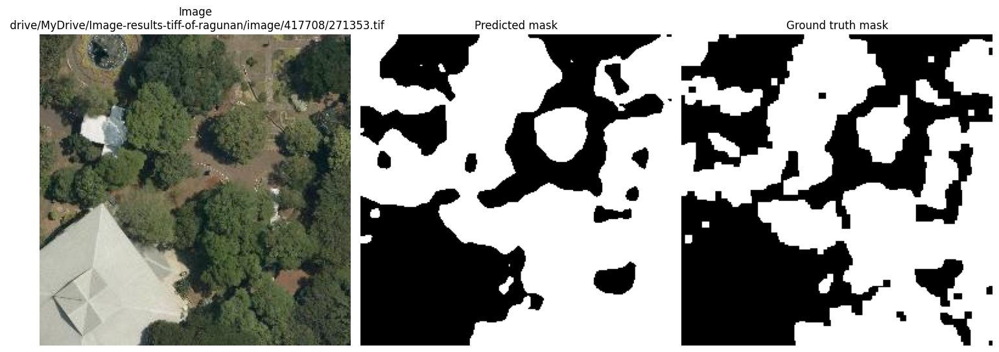

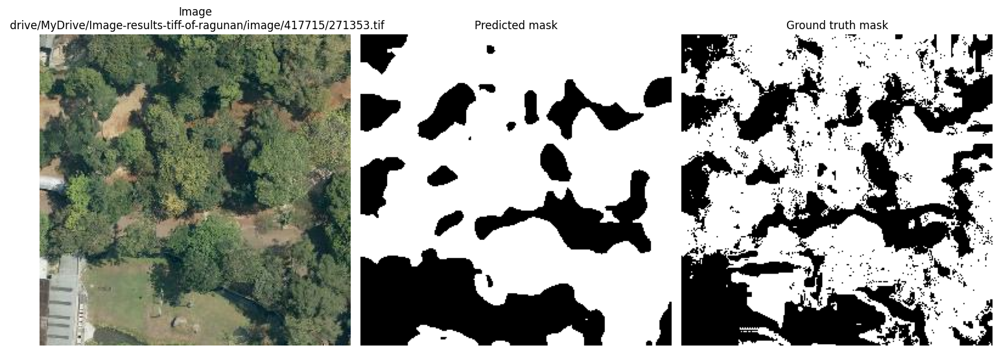

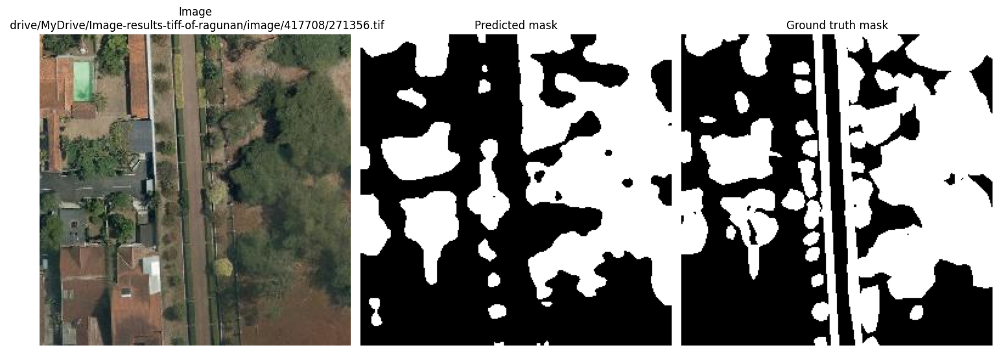

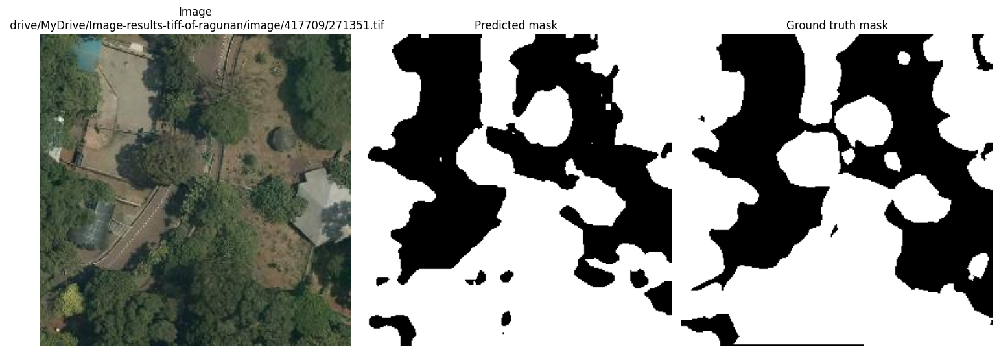

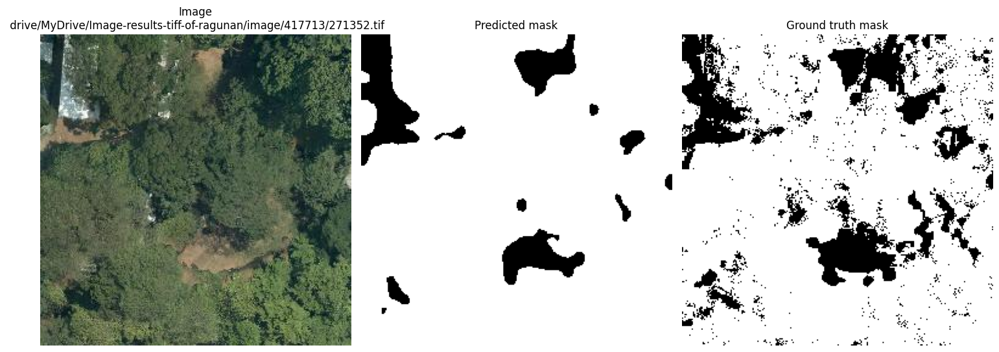

...

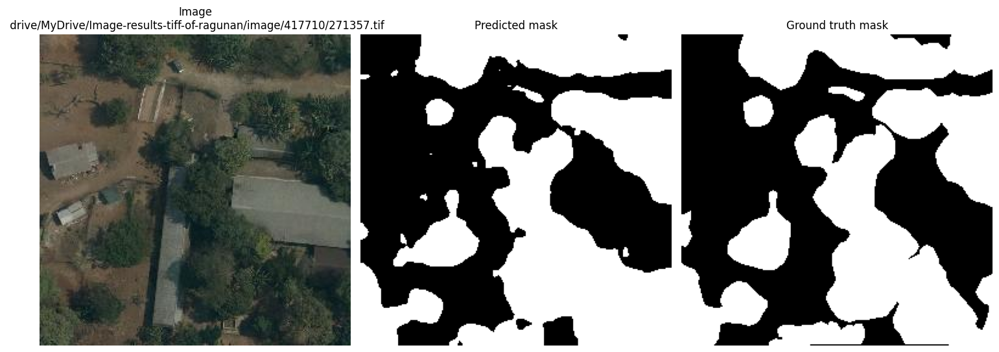

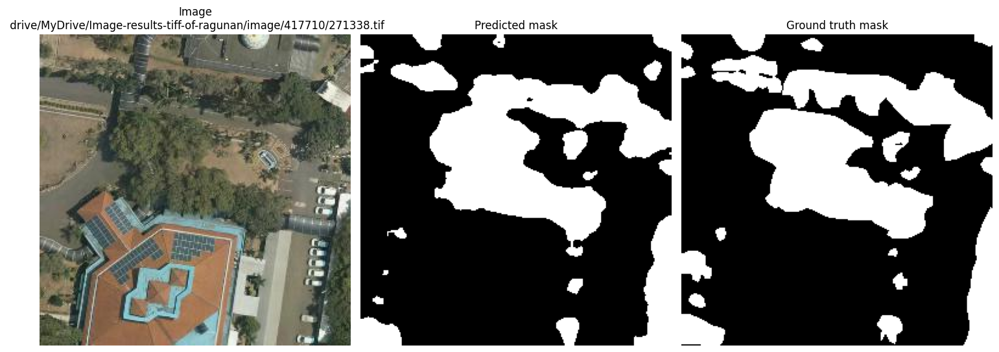

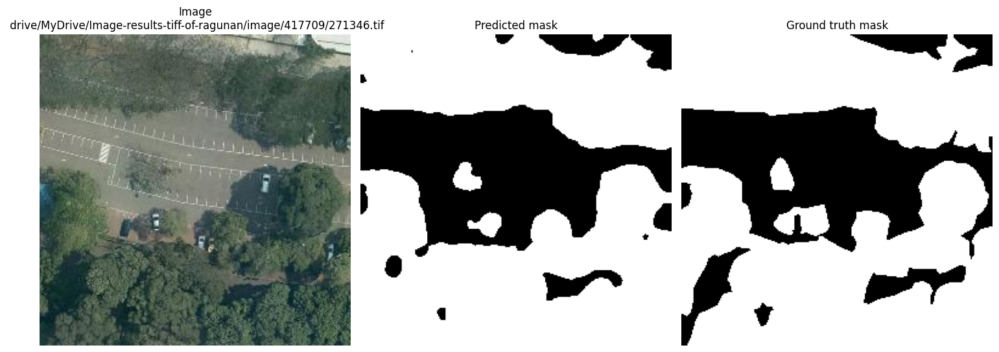

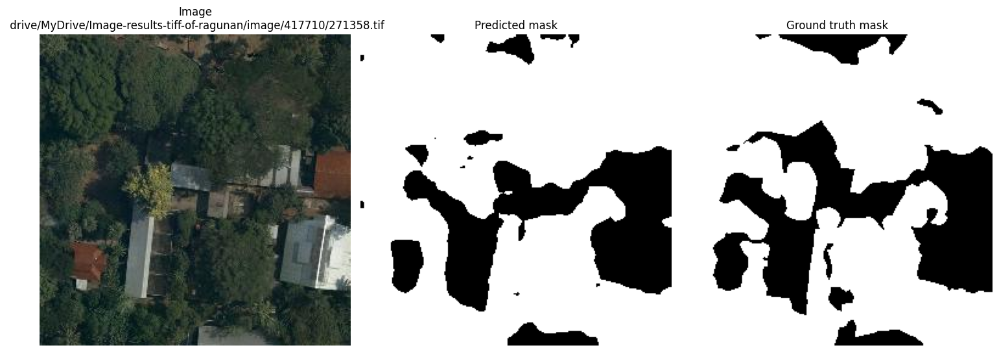

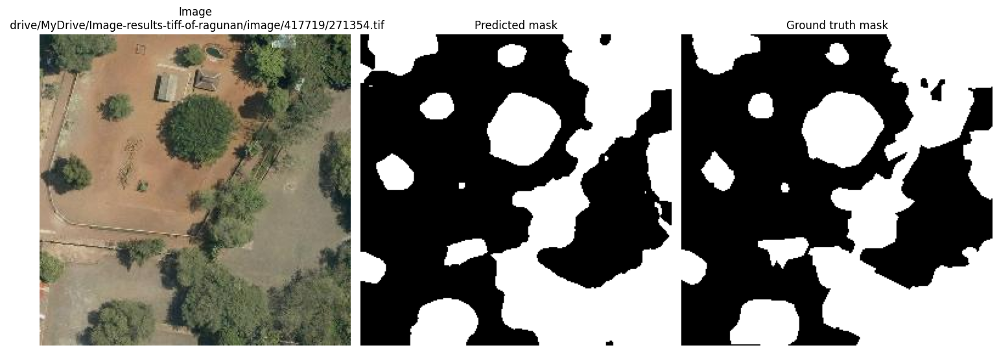

In [33]:
bin_masks = []
gt_masks = []
image_paths = []

with torch.no_grad():
    for images, masks, image_path, mask_path in test_loader:
        images = images.to(device)

        outputs = fine_tune_model(pixel_values = images)
        logits = outputs.logits

        upsampled_logits = F.interpolate(
            logits, size = masks.shape[-2:], mode = "bilinear", align_corners = False
        )

        probs = torch.softmax(upsampled_logits, dim = 1)
        preds = (probs[:, 1, :, :] > 0.5).cpu().numpy().astype(np.uint8) * 255

        for i in range(len(image_path)):
            img_path = image_path[i]
            mask_gt_path = mask_path[i]

            with rasterio.open(img_path) as src:
                img = src.read([1, 2, 3])
                img = np.transpose(img, (1, 2, 0))

            gt_mask = cv2.imread(mask_gt_path, cv2.IMREAD_GRAYSCALE)
            pred_mask = preds[i]

            bin_masks.append(pred_mask)
            gt_masks.append(gt_mask)
            image_paths.append(img_path)

            plt.figure(figsize = (15, 8))
            plt.subplot(1, 3, 1)
            plt.imshow(img)
            plt.title(f"Image\n {img_path}")
            plt.axis("off")

            plt.subplot(1, 3, 2)
            plt.imshow(pred_mask, cmap="gray")
            plt.title("Predicted mask")
            plt.axis("off")

            plt.subplot(1, 3, 3)
            plt.imshow(gt_mask, cmap="gray")
            plt.title("Ground truth mask")
            plt.axis("off")

            plt.tight_layout()
            plt.show()

In [34]:
iou_score = []
total_area = []
images_data = []

for i, img_path in enumerate(image_paths):
    with rasterio.open(img_path) as src:
        GSD_x, GSD_y = src.res

    bin_mask = bin_masks[i]
    gt_mask = gt_masks[i]

    pixels = np.sum(bin_mask > 0)
    veg_area = pixels * (GSD_x * GSD_y)

    iou = calculate_iou(bin_mask, gt_mask)

    print(f"Image {img_path}")
    print(f"GSD x: {GSD_x}")
    print(f"GSD y: {GSD_y}")
    print(f"Pixels: {pixels}")
    print(f"Vegetation coverage area: {veg_area}")
    print(f"IoU score: {iou}")
    print("=========================")

    iou_score.append(iou)
    total_area.append(veg_area)

    images_data.append({
        "img_path": img_path,
        "veg_area": veg_area
    })

print("===========================")
print(f"Average IoU score: {np.mean(iou_score)}")
print(f"Total vegetation coverage area: {np.sum(total_area)}")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 38680
Vegetation coverage area: 21770.26103290333
IoU score: 0.8440826233155513
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 44381
Vegetation coverage area: 3448.755631666604
IoU score: 0.7587536408021289
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 27586
Vegetation coverage area: 15526.225978636798
IoU score: 0.7124710648148148
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 39445
Vegetation coverage area: 22200.82591631003
IoU score: 0.8610951146943084
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 59087
Veg

In [44]:
veg_areas = []
carbon_stocks = []

predicted_carbon = 1761.7253514097679

total_veg_area = sum(i["veg_area"] for i in images_data)
carbon_density = predicted_carbon / total_veg_area

for i in images_data:
    carbon_stock = i["veg_area"] * carbon_density
    veg_areas.append(i["veg_area"])
    carbon_stocks.append(carbon_stock)

    print(f"Image {i['img_path']}")
    print(f"Vegetation coverage area: {i['veg_area']} m^2")
    print(f"Carbon density: {carbon_density} ton/m^2")
    print(f"Estimated carbon stock: {carbon_stock} ton")
    print("================================================")

print("================================================")
print(f"Total vegetation coverage area: {total_veg_area} m^2")
print(f"Total carbon density: {carbon_density} ton/m^2")
print(f"Total estimated carbon stock: {sum(carbon_stocks)} ton")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
Vegetation coverage area: 21770.26103290333 m^2
Carbon density: 0.00721249091732794 ton/m^2
Estimated carbon stock: 157.01780996767366 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
Vegetation coverage area: 3448.755631666604 m^2
Carbon density: 0.00721249091732794 ton/m^2
Estimated carbon stock: 24.874118669478968 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
Vegetation coverage area: 15526.225978636798 m^2
Carbon density: 0.00721249091732794 ton/m^2
Estimated carbon stock: 111.98276385129901 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
Vegetation coverage area: 22200.82591631003 m^2
Carbon density: 0.00721249091732794 ton/m^2
Estimated carbon stock: 160.12325527856484 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
Vegetation coverage area: 4591.52844704456 m^2
Carbon density: 0.00721249